![KU Leuven](img/logo.png)
# Biometrics System Concepts
## Assignment 2: Fingerprint and Iris based Identification

**Name:** Deniz Soysal |
**Student Nr:** r0875700 |
**Date:** February 10, 1942
---

Implement and test a keypoint-based fingerprint and iris recognition system and fuse the two systems together.

A high-level description is provided with links to or hints of code snippets and libraries that you can reuse/adapt at your will (with proper referencing!).

This document is structured as below:  
* [I. Setting](#I.-Setting)
* [II. Fingerprint Recognition](#II.-Fingerprint-Recognition)
  1. Reading data
  2. Baseline model
    1. Choosing a similarity metric
    2. Constructing the similarity matrix
    3. Validation
  3. Model extension 1: local similarity¶
    1. Image enhancements
    2. Feature extraction
    3. local Keypoint Matching
    4. Local Similarity metric
    5. Construct local similarity matrix
    6. Validation
  4. Model extension 2: Global similarity
    1. Image alignment
    2. Global Similarity Metric
    3. Construct global similarity matrix
    4. Validation
  5. Model extension 3: Hybrid features
    1. Hybrid Similarity metric
    2. Construct hybrid similarity matrix
    3. Validation
  6. Solve the murder case
* [III. Iris Recognition](#III.-Iris-recognition)
  1. Reading data
  2. Biometric iris recogntion System
    1. Image enhancement
    2. Construct similarity matrix
    3. Validation
  3. Solve the murder case
* [IV. Multimodal System](#IV-Multimodal-System)
  1. Score fusion
    1. Construct similarity matrix
    2. Validation
  2. Solve the murder case  
* [V. Assignment Instructions](#V.-Assignment-Instructions)


Code examples will be provided below. You can and are invited to adapt these at your will (different parameter settings, different choices of alogorithmic components, add external python files, ...). Try to keep things structured!


In [1]:
#to plot figures inline
%matplotlib inline
# OpenCV package
import cv2
# Standard array processing package
import numpy as np
# Plotting library
from matplotlib import pyplot as plt
# Setting the default colormap for pyplot
import matplotlib as mpl
mpl.rc('image', cmap='gray')
# File path processing package
from pathlib import Path
# Local modules for fingerprint enhancement
import src.fprmodules.enhancement as fe
# Package for some simple biometric metrics. 
# Of course you can use the code you have developed in the previous assignment
from sklearn.metrics import roc_curve
# Pickle allows to save and read intermediate results (similar to save and load in Matlab)
import pickle
# Allows us to generate markdown using python code
from IPython.display import Markdown
# Data analysis and manipulation tool
import pandas as pd
# Cartesian product of 2 iterables
from itertools import product
# Path name pattern searching
import glob
# OS interfaces
import os
# Compression interface
import zlib
# Binary encoding
from base64 import urlsafe_b64encode as b64e, urlsafe_b64decode as b64d

from sklearn import metrics
import seaborn as sns

from scipy.spatial import distance

# Your imports here (if any)
# import ...


In [2]:
# Helper functions
def plot_image_sequence(data, n, imgs_per_row=7, figsize=(10,10), cmap='gray'):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(figsize[0]*n_cols,figsize[1]*n_rows))
    for i in range(n):
        if n == 1:
            ax.grid(False)
            ax.imshow(data[i], cmap=cmap)
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].grid(False)
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i], cmap=cmap)
        else:
            ax[int(i%n)].grid(False)
            ax[int(i%n)].imshow(data[i], cmap=cmap)
    
    plt.show()

## <a id='I.-Setting'></a>I. Setting

Oh no! A woman is found dead in her hotel room. Multiple stab wounds in the chest indicate that it was... *MURDER!*

The police has locked down the hotel and you were brought in to assist the forensics team in finding the murderer. Your associates have reviewed the security footage and have detected a person entering the room with the victim just 15 minutes before the estimated time of death. Unfortunately, the perpetrator did their homework and they were very careful not to give away any leads that might help you identify them. They slipped however, and on their way out touched the door knob with their bare hand...

## <a id='II.-Fingerprint-Recognition'></a> II. Fingerprint Recognition

### 1. Reading data
#### *Reading the image data and converting to grayscale*


Before you get started on anything it is always a good idea to visualise your data. Let's first have a look at the fingerprint that was collected from the door knob first... 

Note that we convert the data to grayscale, we're not interested in color values (and don't have them).

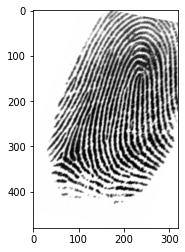

In [3]:
perpetrator_fp = cv2.imread('./perpetrator_fp.png')

assert (
    (perpetrator_fp[...,0] == perpetrator_fp[...,1]).all() and
    (perpetrator_fp[...,1] == perpetrator_fp[...,2]).all()
)

perpetrator_fp = cv2.cvtColor(perpetrator_fp, cv2.COLOR_BGR2GRAY)

plt.grid(False)
plt.imshow(perpetrator_fp,cmap='gray');


Now, let's have a look at the other fingerprint data that was provided to you. This data is stores in `data/NIST301/`. There were apparently 100 guests in the hotel at the time of murder. The filename indicates the subject identifier. Below we have provided a function to read and label these fingerprints. Let's take a look!

In [4]:
def read_DB(path):
    images = []
    labels = []
    imagePaths = sorted(Path(path).rglob("*.png"))
    for imagePath in (imagePaths):
        image = cv2.imread(path + imagePath.name)
        if (len(image.shape) > 2):
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        images.append(image)
        label = imagePath.stem[0:3]
        labels.append(label)
    return (images, labels)


# Read the fingerprint database
images_db, labels_db = read_DB('data/NIST301/')

# Save some metadata
n_imgs = len(images_db)
img_height, img_width = images_db[0].shape

Markdown(f"""Here are some samples from the database, which contains {n_imgs} images of size {img_height}x{img_width}. Remember, visualization is always a good idea, so let's visualize some""")

Here are some samples from the database, which contains 100 images of size 480x320. Remember, visualization is always a good idea, so let's visualize some

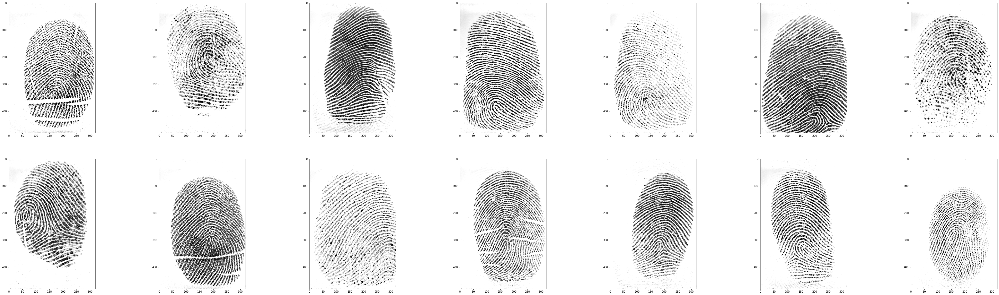

In [5]:
n = 14
plot_image_sequence(images_db,n) 

In [6]:
print(labels_db)


['001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', '031', '032', '033', '034', '035', '036', '037', '038', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '050', '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', '061', '062', '063', '064', '065', '066', '067', '068', '069', '070', '071', '072', '073', '074', '075', '076', '077', '078', '079', '080', '081', '082', '083', '084', '085', '086', '087', '088', '089', '090', '091', '092', '093', '094', '095', '096', '097', '098', '099', '100']


### 2. A baseline model

#### 2.1. Choosing a similarity metric
In your first assignment the similarity metric was already provided, in this assignment you have the chance to play around with distances and similarities yourself! Let's give it a shot!

According to a [paper](https://www.worldscientific.com/doi/abs/10.1142/S0218001411009007) published in the International Journal of Pattern Recognition and Artificial Intelligence, authors found that Minkowski, Sorgel, Jaccard, Motyka perform well for fingerprint recognition. We will try some of these measures, with also more classical ones such as Mean Squared Difference and Euclidian.

In [7]:
import math

#we also use the scipy.spatial.distance library for some of the distance

mss = lambda x,y: 1/(1+np.square(x-y).mean())
squared_eucl = lambda x,y: np.sum((x-y)**2)
eucl = lambda x,y: math.sqrt(squared_eucl(x, y))
minkowski = lambda x,y:distance.minkowski(x.flatten(),y.flatten(),p=3)
cheb = lambda x,y: distance.chebyshev(x.flatten(),y.flatten())

metric_list = ["mss", "eucl","minkowski","cheb"]

#### 2.2. Constructing the similarity score table
Since we're not in an authentication scenario, all we can do is to calculate the similarity scores between each fingerprint in the database and the one from the perpetrator.
Once we have a metric for each image, we can just sort them and store them in a table. Note that you have space to get creative with visualization!

In [8]:
def constructSimilarityTable(org_img,img_db, labels, dist_func):
    #dist_func is the function that computes the distance between two images
    data=[]
    for i,img in enumerate(img_db):
        data.append([
            labels[i],
            dist_func(org_img, img)])
    assert (len(data) == len(img_db))
    return pd.DataFrame(data, columns=['id', 'score'])

sim_tb0 = constructSimilarityTable(perpetrator_fp,images_db, labels_db, mss)
sim_tb0

,id,score
0,001,0.015581
1,002,0.015476
2,003,0.014335
3,004,0.013319
4,005,0.015193
...,...,...
95,096,0.015435
96,097,0.015017
97,098,0.014682
98,099,0.012899


In [9]:
sorted_sim_tb0 = sim_tb0.sort_values(by=['score'], ascending=False)
sorted_sim_tb0

,id,score
87,088,0.017036
80,081,0.016824
41,042,0.016668
22,023,0.016646
76,077,0.016608
...,...,...
67,068,0.012278
70,071,0.012171
68,069,0.011835
77,078,0.011823


In [10]:
print("Difference of top 2 matches is : ", sorted_sim_tb0.iloc[0]["score"] - sorted_sim_tb0.iloc[1]["score"] )

Difference of top 2 matches is :  0.00021193231867921644


We can see that the highest match score 0.0170 
belongs to subject 088. However, subject 081 is not far behind with 
a score of 0.0168! Surely we can do a better job than that. Or can we..?

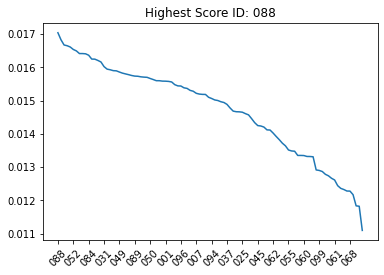

In [11]:
ids,scores = sim_tb0.sort_values(by='score', ascending=False).values[:,0],sim_tb0.sort_values(by='score', ascending=False).values[:,1]
plt.plot(ids,scores)
plt.xticks(np.arange(0,100,5),ids[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids[0]);
plt.savefig('report/images/similarities_initial.png')

Markdown(f'''We can see that the highest match score {scores[0]:.4f} 
belongs to subject '''+ids[0]+'. However, subject '+ids[1]+f''' is not far behind with 
a score of {scores[1]:.4f}! Surely we can do a better job than that. Or can we..?''')

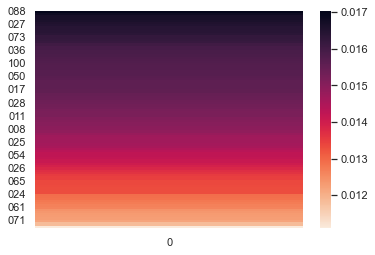

In [12]:
df = pd.DataFrame(scores, dtype="float")
df = df.set_index(ids)
sns.set_theme()
ax = sns.heatmap(df,cmap="rocket_r")
# ax.invert_xaxis()


<div class="alert alert-block alert-success">
<b>Q1: </b> Now that we have some results, is the given similarity function a good metric to quantify the distance between two fingerprints? Is it reliable enough to incriminate a suspect? What are its limitations?
</div>

<span style="color:magenta">
    
In the database, we have 100 fingerprints, corresponding to 100 identities. We compare the fingerprint of the **murderer** with the 100 identities of the database.

What we do here is just looking at the mean squared difference between the pixels values of the 2 images. Applying directly this method is not robust. As we have seen in the plot of the fingerprints, the fingerprints have different scales, orientation, translation, etc. We need first to align them to be able to use mean squared difference : The fingerprints needs to be aligned to generate a score that represent truly if the fingerprint are matching or not.
</span>





### 3. Model extension 1 
#### *Local Similarity*

#### 3.1. Image enhancements
In this next step we re-use code developed by [Utkarsh Deshmukh](https://github.com/Utkarsh-Deshmukh/Fingerprint-Enhancement-Python), to enhance the fingerprint images. It is a Python-recode of Matlab-code developed by [Peter Kovesi](https://www.peterkovesi.com/matlabfns/index.html#fingerprints). I have slightly adapted this code to make it more compliant with OpenCV. It uses gradient-based orientation and local frequency estimation as input to an orientation and frequency selective filtering using a Gabor filterbank. At the same time a foreground region segmentation (mask) is determined by calculating the standard deviation in local windows and thresholding above a certain level. Please briefly read through the [github README](https://github.com/Utkarsh-Deshmukh/Fingerprint-Enhancement-Python) to better understand what it is doing! 

In [13]:
# Calcuate the enhanced images and the associated segmentation masks

def enhance_images(images):
    images_e_u = []
    masks = []
    for i, image in enumerate((images)):
        try:
            # Gabor filtering
            img_e, mask, orientim, freqim = fe.image_enhance(image)
            # Normalize in the [0,255] range
            img_e_u = cv2.normalize(img_e, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=0)
            images_e_u.append(img_e_u)
        except:
            print('error for: ', i)
            images_e_u.append(image)
        masks.append(mask)
    return np.array(images_e_u), np.array(masks)

try:
    with open("images_masks_db.pkl","rb") as f:
        images_enhanced_db, masks_db = pickle.load(f)
        print("File found : enhanced images and masks loaded")
except:
    images_enhanced_db, masks_db = enhance_images(images_db)
    print("File not found : enhanced images and segmentations masks are computed (it may take a while)")
    with open("images_masks_db.pkl",'wb') as f:
        pickle.dump([images_enhanced_db,masks_db],f)

File found : enhanced images and masks loaded


<div class="alert alert-block alert-info">
<b>Tip:</b> Intermediate (computation heavy) results can be saved on file using the pickle package, use <code>pickle.dump</code> to save and <code>pickle.load</code> to load data from a file. The code snippet below will run the computation and save results if there are no previous records, and reload them in later runs. 
Have a look at the <a href="https://wiki.python.org/moin/UsingPickle">wiki</a> for more information. 
<pre>
<code>
<!-- language: lang-python -->
try:
    with open("images_masks_db.pkl","rb") as f:
        images_enhanced_db, masks_db = pickle.load(f)
except:
    images_enhanced_db, masks_db = enhance_images(images_db)
    with open("images_masks_db.pkl",'wb') as f:
        pickle.dump([images_enhanced_db,masks_db],f)
</code>
</pre>

</div>


Note that the images are now much more crisp and that the foreground segmentation was successful even if the technique is rather simple!

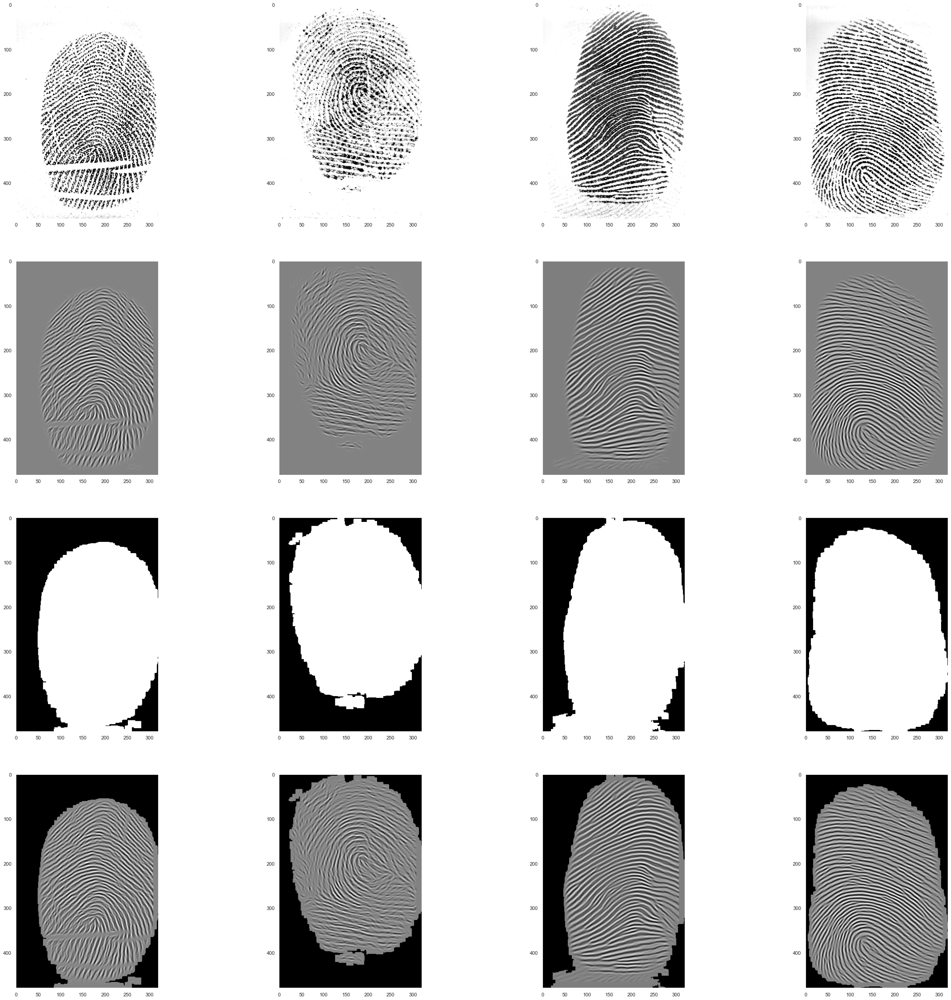

In [14]:
n=4
images_segmented_db = [a*b for a,b in zip(images_enhanced_db,masks_db)]
plot_image_sequence(images_db[:n] + images_enhanced_db.tolist()[:n] + masks_db.tolist()[:n] + images_segmented_db[:n], 4*n, n)

#### 3.2. Feature extraction
As you might have noticed by now comparing images on a pixel level is too simple and limited. The basic/traditional fingerprint matching algorithm are based on matching keypoints, called minutiae. They are defined as the ridge endings and bifurcations and can be determined by first thresholding the FP image and skeletonizing/thinning the enhanced image. For those really interested (but not part of this assignment) in experimenting with such an approach, some code is provided in the `fprmodules/minutiae_extraction` folder.

Instead, we will rely on establised methods developed in Computer Vision, where the use of keypoint features has proven to be very succesfull (prior to the advent of Deep Learning) in image classification, image alignment and object recognition tasks. A keypoint is a point of interest in an image, it does not necesarily need to be recognisable by a human but it can be. In this project we use keypoints to compare images on 3 levels:
1. Local feature descriptors
2. Global features
3. Hybrid features

To better highlight what is going on we will plot the results on two fingerprint images from our database.

In [15]:
# test example
testNr1 = 48

testNr2 = 17

##### 3.2.1 ORB features

**Keypoint detection** algorithms will result in points of interest on your image, which keypoints are used is dependent on the technique. We will make use of ORB (Oriented FAST and Rotated BRIEF) detection and descriptor algorithm as implemented in [OpenCV ORB](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_orb/py_orb.html).


You are encouraged to try out a series of detection/description/matching algorithms. A short overview of these methods can be found in the OpenCV documentation: [Feature detection and description](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_table_of_contents_feature2d/py_table_of_contents_feature2d.html). 
Please read these pages carefully and try to understand these methods.

In [16]:
def detect_keypoints(img, mask, keypoint_detector, kernel_size=(5,5)):
    """
        Detects keypoints in an image. 
        
        Note: Many false keypoints will be generated at the edge of the foreground mask, since ridges seem to terminate due to the clipping.
        we remove these by a morpholigical erosion (shrinking) of the foreground mask and deleting the keypoints outside.
    """
    # find the keypoints with detector
    kp = keypoint_detector.detect(img)
    #convert mask to an unsigned byte
    mask_b = mask.astype(np.uint8)  
    # morphological erosion
    mask_e = cv2.erode(mask_b*255, kernel = np.ones(kernel_size,np.uint8), iterations = 5)
    # remove keypoints and their descriptors that lie outside this eroded mask
    kpn = [kp[i] for i in range(len(kp)) if mask_e.item(int(kp[i].pt[1]),int(kp[i].pt[0])) == 255] 
    return kpn

detector = cv2.ORB_create()
kp1 = detect_keypoints(images_enhanced_db[testNr1], masks_db[testNr1], detector)
kp2 = detect_keypoints(images_enhanced_db[testNr2], masks_db[testNr2], detector)

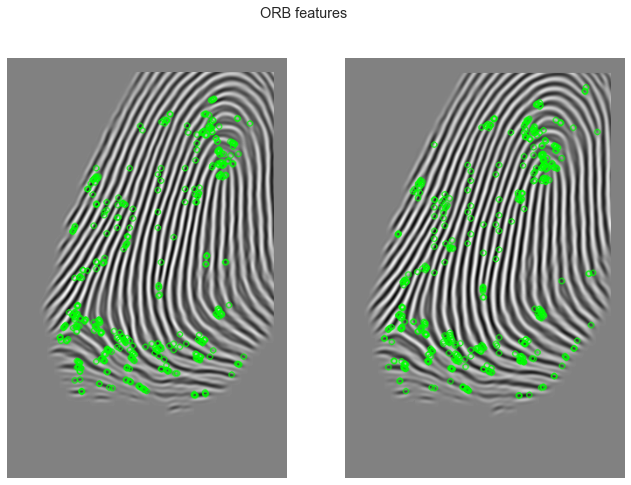

In [17]:
img1 = cv2.drawKeypoints(images_enhanced_db[testNr1],kp1,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img2 = cv2.drawKeypoints(images_enhanced_db[testNr2],kp2,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)

f, axarr = plt.subplots(1,2,sharey=True)
f.tight_layout()
#Uncomment below line to change figure size
f.set_size_inches(10,8)
axarr[0].axis('off')
axarr[1].axis('off')
f.suptitle('ORB features')
axarr[0].imshow(img1),axarr[1].imshow(img2),plt.show();

<span style="color:magenta">Let's also visualize in details one of the keypoint

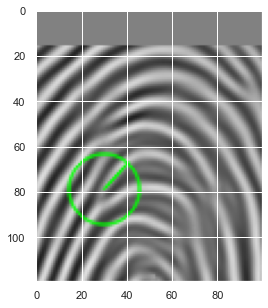

In [18]:
img1 = cv2.drawKeypoints(images_enhanced_db[testNr1],kp1[13:14],None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

f, axarr = plt.subplots(1,1, figsize=(8,5))
axarr.imshow(img1[0:120,200:300])

**The Local Feature descriptor** will give you a vector describing the local region around the key-point in the feature space. Note that these feature descriptors give a vectorial summary of the neighbourhood around each keypoint. A simple metric on these vectors (Euclidean Distance for continuous variables, Hamming Distance for binary variables) can then be used to determine similarity.

In [19]:
def compute_local_descriptor(img, kp, detector):
    kp, des = detector.compute(img, kp)
    return np.array(kp), des

kp1, local_des1 = compute_local_descriptor(images_enhanced_db[testNr1], kp1, detector)
kp2, local_des2 = compute_local_descriptor(images_enhanced_db[testNr2], kp2, detector)

Text(0.5, 1.0, 'feature representation of ORB (value coded from 0 to 250)')

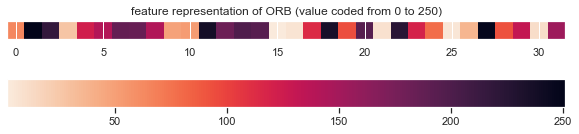

In [20]:
array_local_des1 = np.array(local_des1[0])
plt.figure(figsize=(10,5))
plt.imshow(array_local_des1.reshape(1,-1), cmap="rocket_r", interpolation='nearest')  
plt.colorbar(orientation='horizontal')
plt.yticks([])
plt.title('feature representation of ORB (value coded from 0 to 250)')

#### 3.3. Local Keypoint Matching
**Keypoint Matchers** match keypoints that have similar descriptors in an image pair and computes the distances between the best matching pairs of keypoints. In this implementation we make use of the brute force matcher of OpenCV, documentation can be found [here](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_matcher/py_matcher.html). As a distance between descriptors we make use of the normalised [Hamming distance](https://en.wikipedia.org/wiki/Hamming_distance). 

In [21]:
def brute_force_matcher(des1, des2, dist=cv2.NORM_HAMMING):
    """
      Brute Force matcher on a pair of KeyPoint sets using the local descriptor for similarity
      
      returns all pairs of best matches
    """
    
    # crossCheck=True only retains pairs of keypoints that are each other best matching pair
    bf = cv2.BFMatcher(dist, crossCheck=True)
    matches = bf.match(des1, des2)
    
    # sort matches based on descriptor distance
    matches.sort(key=lambda x: x.distance, reverse=False)
    
    return np.array(matches)

# store the local keypoint matches
local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)

# save the source index and target index of the keypoints in the corresponding keypoint sets
local_pt_source, local_pt_target = np.array([
    (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T

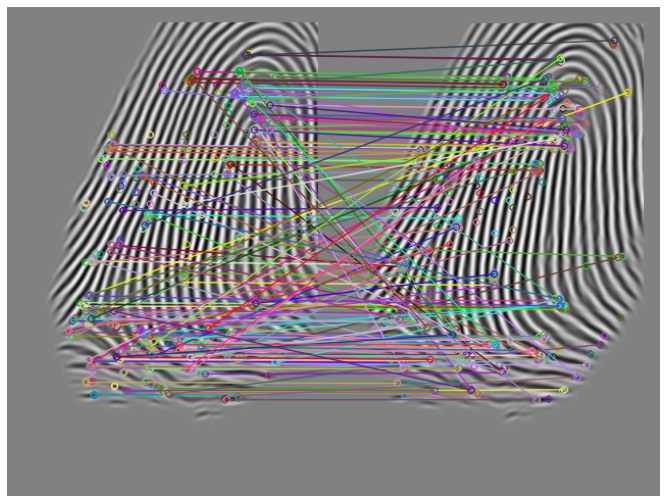

In [22]:
# Visualize the matched keypoints

imMatches = cv2.drawMatches(images_enhanced_db[testNr1],kp1,
                            images_enhanced_db[testNr2],kp2,local_k1_k2_matches, None) 
plt.imshow(imMatches)
plt.gcf().set_size_inches(18,9)
plt.gca().axis('off');
plt.savefig('report/images/matches_initial.png')

plt.show()

<div class="alert alert-block alert-success">
<b>Q2:</b> Are all the keypoint matches accurate? Are they expected to be? Explain why.
</div>

<span style="color:magenta">

No, they are not accurate. The reason is that the fingerprints are not aligned, therefore doing matches on non-alinged fingerprints is challenging : we must first align them to be able to match the keypoints

</span>.


<div class="alert alert-block alert-info">
<b>Tip:</b> Make sure you spent the proper amount of time on constructing the similarity metrics, a good implementation will save you a lot of time in the long run! </div>

#### 3.4. Local Similarity metric
Now that we have matching keypoints we can define simple scalar measures on this set of distances, such as the number of pairs with a distance smaller than a set threshold, or the sum/mean of the first N distances (ranked from small to larger), etc.

In [23]:
def local_img_similarity(matches):
    # feature distance
        
    # given these matches we have to come up with a metric, note that some of the matches will be successful 
    # while others will be faulty, it is important that we only take reliable matches as to not skew the similarity
    dist = [i.distance for i in matches]
    dist.sort()
    top_n = 30
    best_n_matches = dist[:top_n]    
    scores =1/(np.mean(best_n_matches)+np.finfo(float).eps)
    return scores

In [24]:
def local_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # distances between matches that are below threshold
    return local_img_similarity(local_k1_k2_matches)
    


<div class="alert alert-block alert-info">
<b>Tip:</b> Don't forget to apply the same preprocessing to the perpetrator image.

</div>


In [25]:
perp_img_en, perp_img_mask = enhance_images([perpetrator_fp])
perp_img_en = perp_img_en[0]
perp_img_mask = perp_img_mask[0]

#### 3.5 Local Similarity Scores

In [31]:
sim_tb1 = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, local_similarity)

1 056 0.03699
2 049 0.03614
3 048 0.03282
4 018 0.03268
5 076 0.03261
6 022 0.03080
7 053 0.01956
8 068 0.01906
9 045 0.01863
10 061 0.01847


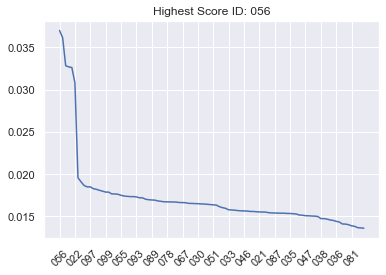

In [32]:
sim_tb1 = sim_tb1.sort_values(by='score', ascending=False)
ids,scores = sim_tb1.values[:,0],sim_tb1.values[:,1]
plt.plot(ids,scores)
plt.xticks(np.arange(0,100,5),ids[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids[0]);

[print(i+1, sim_tb1.iloc[i,0], f"{sim_tb1.iloc[i,1]:.5f}") for i in range(10)];


A good idea in this plot, where we cannot see one clear subject (as the first 6 subjects are all pretty close), is to take a look at the knee point for a score threshold. Also, let's normalize our scores in order to get a well generalized scale.

Knee at: 8	 Treshold:  0.21583140066999004


 With the threshold of 0.216, we can see a more clear divide between the subjects. However, the best 6 matches are all pretty close... We should be able to come up with a better discriminator by using a global similarity metric.

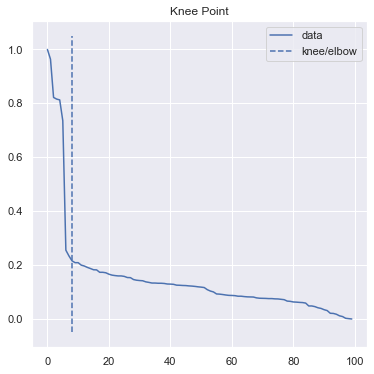

In [56]:
#Simple module to find the knee in a series
from kneed import KneeLocator

scores_local = (scores - scores.min()) / (scores.max() - scores.min())

kneedle = KneeLocator(list(range(len(ids))),scores_local,S=1.1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle.knee}\t Treshold: ',kneedle.knee_y)
kneedle.plot_knee()
Markdown(f" With the threshold of {kneedle.knee_y:.3f}, we can see a more clear divide between the subjects. However, the best 6 matches are all pretty close... We should be able to come up with a better discriminator by using a global similarity metric." )

### 4. Model extension 2: Global similarity


**Global features**, here we use the matching keypoints to align the fingerprints, this allows us to compare the images as a whole (globally). Once the images are aligned we can take into account the distance between the key-points in the ambient space (the coordinates of the key-points). This is also referred to as geometrical distance since this is just comparing two points that are part of the intrinsic geometry of the object (no matter how you move the image around the point will move around with it and stay in the same location on the finger).

#### 4.1 Image alignment
[Here](https://www.learnopencv.com/image-alignment-feature-based-using-opencv-c-python/) you can find a description and code how to start from the brute force matching results and estimate the best transformation (from a family of transformations) that aligns the two images. In the example, a homography-type transformation is searched for. However, this has too many degrees of freedom for our application. We substituted this by a more constrained (only 4 degrees of freedom) similarity (partial affine) transformation.

These routines iteratively determine the minimal set of matching points that define a transformation that optimally aligns all other points as well, taking care of outliers at the same time. This method is a very general optimization technique and is called RANSAC, for "RANdom SAmple Consensus". See, apart from many other sources on the internet, [this presentation](http://www.cse.psu.edu/~rtc12/CSE486/lecture15.pdf) for further explanation. 

In [57]:
def estimate_affine_transform_by_kps(src_pts, dst_pts):
    """
        Returns the Affine transformation that aligns two sets of points
    """
    transform_matrix, inliers = cv2.estimateAffinePartial2D(src_pts, dst_pts, 
                                           method =  cv2.RANSAC, 
                                           confidence = 0.9, 
                                           ransacReprojThreshold = 10.0, 
                                           maxIters = 5000, 
                                           refineIters = 10)
    return transform_matrix, inliers[:,0]

def warp_points(pts, M):
    mat_reg_points = cv2.transform(pts.reshape(-1,1,2), M)
    
    # return transformed keypoint list
    return cv2.KeyPoint.convert(mat_reg_points) 

def warp_img(img, M):
    return cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))

# estimate the affine transform that aligns the matched keypoints
M, inliers = estimate_affine_transform_by_kps(
    cv2.KeyPoint.convert(np.array(kp1)[local_pt_source]), 
    cv2.KeyPoint.convert(np.array(kp2)[local_pt_target]))

kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
img1_reg =  warp_img(images_enhanced_db[testNr1], M)

Let's have a look at how the images are alinged. Try visualizing different pairs of fingerprints! You may notice the estimated transform will be more extreme for images that are less similar, and will become more subtle as the images become more similar.

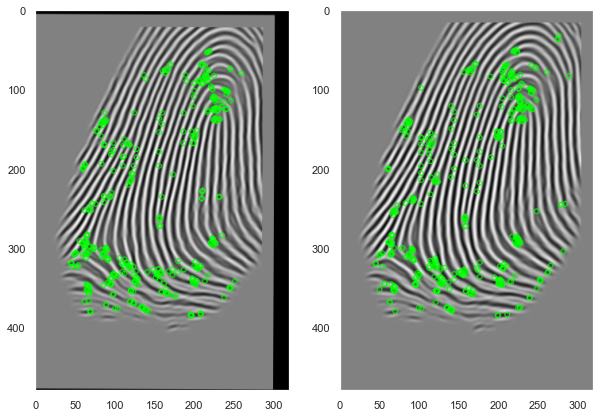

In [58]:
show_img1 = cv2.drawKeypoints(img1_reg, kp1_reg, None, (0, 255, 0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)
show_img2 = cv2.drawKeypoints(images_enhanced_db[testNr2], kp2, None, (0, 255, 0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize=(10,10))
ax[0].grid(False)
ax[1].grid(False)
_=ax[0].imshow(show_img1), ax[1].imshow(show_img2), plt.show()

As you might have noticed the `estimateAffinePartial2D` function does not only return the transformation matrix but also the minimal set of matching points that were used to to determine the transformation. This gives us a better, more refined set of keypoints. 

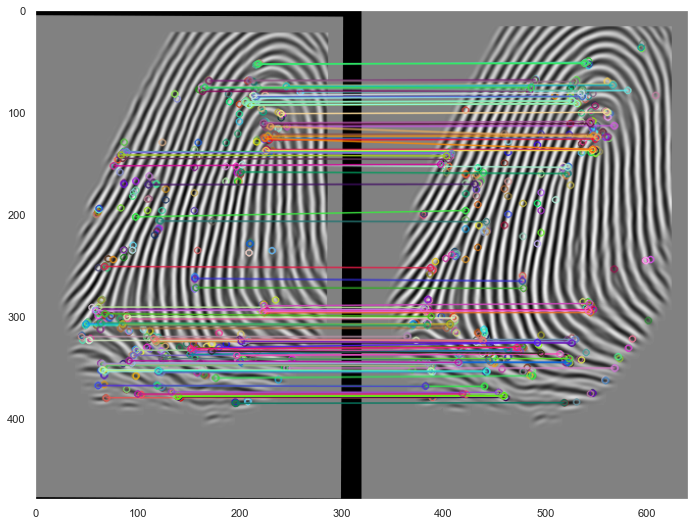

In [59]:
global_k1_k2_matches = local_k1_k2_matches[inliers == 1]

imMatches = cv2.drawMatches(img1_reg, kp1_reg, images_enhanced_db[testNr2], kp2, global_k1_k2_matches.tolist(), None)
plt.grid(False)
_ = plt.imshow(imMatches)
f=plt.gcf()
f.set_size_inches(18,9), plt.show();

#### 4.2 Global Similarity Metric

<div class="alert alert-block alert-success">
<b>Q3: </b> Choose a global feature similarity function, (e.g. you can start from euclidean distance between the reduced sets of KeyPoints and count the values above a threshold).
</div>

From metric_list = ["mss", "eucl","minkowski","cheb"] we defined earlier, we will try and see the performance of each of the metric of this list

In [60]:
def get_reduced_set(matches,reg_kp1,kp2):
    # get reduced keypoint set from matches
    reg_kp1 = cv2.KeyPoint_convert(reg_kp1)
    kp2 = cv2.KeyPoint_convert(kp2)
    kp1_reduced,kp2_reduced = [],[]
    for i in matches:
        kp1_reduced.append(reg_kp1[i.queryIdx])
        kp2_reduced.append(kp2[i.trainIdx])
    return kp1_reduced,kp2_reduced

In [61]:
def global_img_similarity(matches, reg_kp1, kp2,metric,threshold):
    #matches is a Dmatch object (see https://docs.opencv.org/4.x/d4/de0/classcv_1_1DMatch.html)
    #first let's get the reduce set of keypoint
    kp1_reduced,kp2_reduced = get_reduced_set(matches, reg_kp1, kp2)
    #for each match, we will compute the distance between the 2 matching keypoint
    distances = []
    counter = 0
    for i in range(0,len(kp1_reduced)):
        #metrics from scipy.distance need a 2D array, while the Eucl function we have define don't
        if metric == eucl:
            dist = metric(kp1_reduced[i],kp2_reduced[i])
        else :
            a = kp1_reduced[i].reshape(1, -1)
            b = kp2_reduced[i].reshape(1, -1)
            dist = metric(a,b)
        distances.append(dist)
        if dist < threshold:
            counter += 1
    return counter 




In [62]:
def global_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # get source and target index for each match
    local_pt_source, local_pt_target = np.array([
        (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T
    
    # use matching keypoints to estimate an affine transform between keypoints
    M, inliers = estimate_affine_transform_by_kps(
        cv2.KeyPoint.convert(kp1[local_pt_source]), 
        cv2.KeyPoint.convert(kp2[local_pt_target]))
    
    # if no inliers can be found
    if M is None: 
        return 0
    
    # warp the keypoints according to the found transform
    kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
    
    # subset the keypoints, inliers are considered good keypoints
    # since they were used in finding the transformation
    global_k1_k2_matches = local_k1_k2_matches[inliers == 1]
    
    # compute global similarity based aligned matching global keypoints
    return global_img_similarity(global_k1_k2_matches,kp1_reg, kp2,metric=metric,threshold=1)

metric = mss
sim_tb2_mss = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, global_similarity)
metric = eucl
sim_tb2_eucl = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, global_similarity)
metric = minkowski
sim_tb2_minkowski = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, global_similarity)
metric = cheb
sim_tb2_cheb = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, global_similarity)


In [63]:
def transformTopScoresToText(dataframe, n):
    
    """
    
    Fonction to transform the "n" largest scores of the dataframe into a string, to be able to plot in on figures
    
    """
    
    
    top = dataframe.nlargest(n, 'score').reset_index()
    table = ""
    for i in range(0,len(top.index)):
        string = "ID " + str(top['id'][i]) + " -> " + "SCORE: " + str(top['score'][i]) + "\n"
        table += string
    return table

top_eucl = transformTopScoresToText(sim_tb2_eucl, 10)  
top_mss = transformTopScoresToText(sim_tb2_mss, 10)  
top_cheb = transformTopScoresToText(sim_tb2_cheb, 10)  
top_minkowski = transformTopScoresToText(sim_tb2_minkowski, 10)  

print(top_eucl,type(top_eucl))

ID 056 -> SCORE: 47
ID 018 -> SCORE: 32
ID 049 -> SCORE: 28
ID 048 -> SCORE: 25
ID 022 -> SCORE: 24
ID 076 -> SCORE: 24
ID 003 -> SCORE: 2
ID 035 -> SCORE: 2
ID 058 -> SCORE: 2
ID 007 -> SCORE: 1
 <class 'str'>


<div class="alert alert-block alert-success">
<b>Q4: </b> Visualize the scores and determine a score threshold to discriminate the matching fingerprints. Explain how you determine the threshold.
</div>

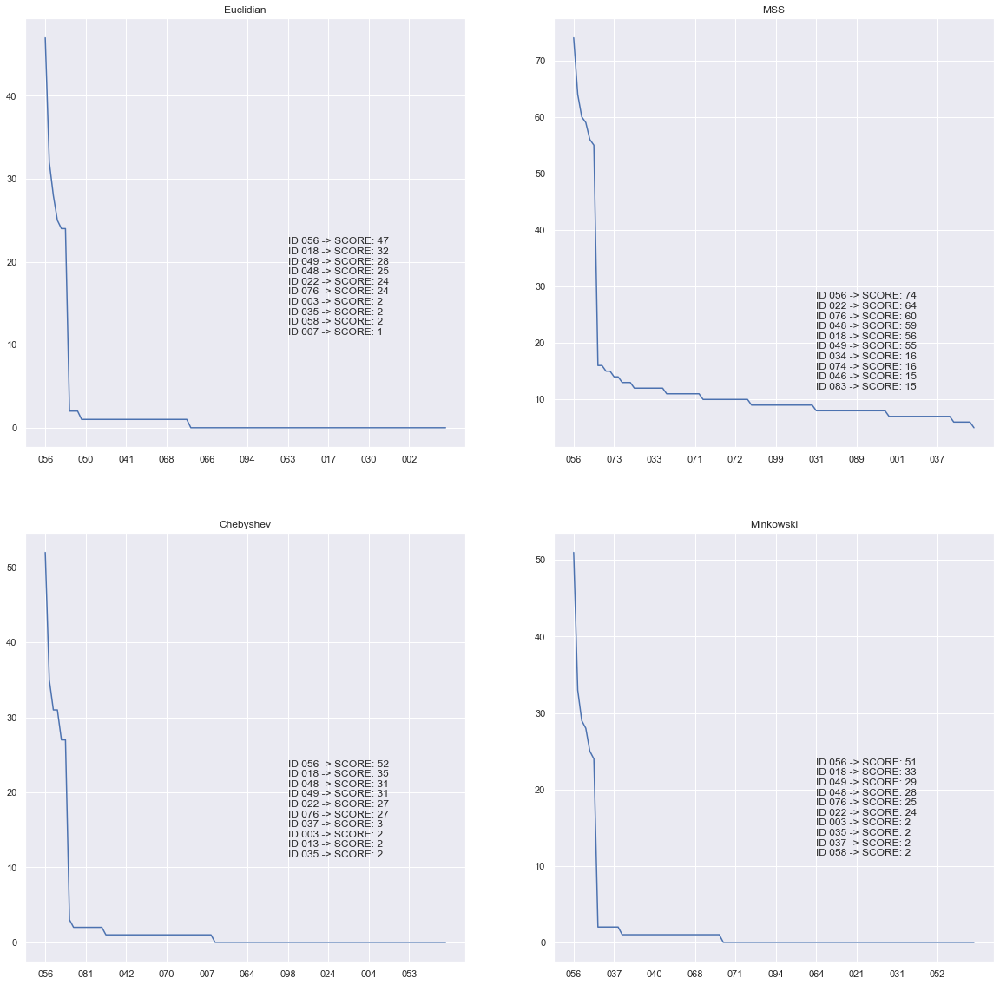

In [64]:
similarities = [sim_tb2_eucl,sim_tb2_mss,sim_tb2_cheb,sim_tb2_minkowski]
top_scores = [top_eucl, top_mss, top_cheb, top_minkowski]
title = ["Euclidian","MSS","Chebyshev","Minkowski"]


fig, axs = plt.subplots(len(similarities)//2,len(similarities)//2,figsize=(20,20))


#iterate through axes
for i, ax in enumerate(fig.axes):
        sim = similarities[i].sort_values(by='score', ascending=False)
        ids,scores = sim.values[:,0],sim.values[:,1]
        ax.plot(ids,scores)
        ax.set_xticks(ids[np.arange(0,100,10)])
        ax.set_title(title[i])
        ax.text(60, 10, top_scores[i])
plt.savefig('report/images/comparison_metric1.png')



To see which of these metrics separate the most the data, let's normalize the similarity scores and look at the difference between the top matching score. Just looking at the top matchign scores should be sufficient. 

In [65]:
#normalize each similarity vector, and sort their values by descending values

sim_tb2_eucl_normalized = ((sim_tb2_eucl["score"] - sim_tb2_eucl["score"].min()) / (sim_tb2_eucl["score"].max() - sim_tb2_eucl["score"].min())).sort_values(ascending=False)
sim_tb2_mss_normalized = ((sim_tb2_mss["score"] - sim_tb2_mss["score"].min()) / (sim_tb2_mss["score"].max() - sim_tb2_mss["score"].min())).sort_values(ascending=False)
sim_tb2_cheb_normalized = ((sim_tb2_cheb["score"] - sim_tb2_cheb["score"].min()) / (sim_tb2_cheb["score"].max() - sim_tb2_cheb["score"].min())).sort_values(ascending=False)
sim_tb2_minkowski_normalized = ((sim_tb2_minkowski["score"] - sim_tb2_minkowski["score"].min()) / (sim_tb2_minkowski["score"].max() - sim_tb2_minkowski["score"].min())).sort_values(ascending=False)




In [66]:
from beautifultable import BeautifulTable


vectors = [sim_tb2_eucl_normalized,sim_tb2_mss_normalized,sim_tb2_cheb_normalized,sim_tb2_minkowski_normalized]
diff_top1_top2 = []
diff_top2_top3 = []

for i in range(0,4):
    diff_top1_top2.append(vectors[i].iloc[0] - vectors[i].iloc[1])
    diff_top2_top3.append(vectors[i].iloc[1] - vectors[i].iloc[2])

table = BeautifulTable()
table.rows.append([diff_top1_top2[0],diff_top1_top2[1],diff_top1_top2[2],diff_top1_top2[3]])
table.rows.append([diff_top2_top3[0],diff_top2_top3[1],diff_top2_top3[2],diff_top2_top3[3]])
table.rows.header = ["Top 1 - Top 2","Top 2 - Top 3"]
table.columns.header = ["Eucl", "MSS", "Cheb", "Minkowski"]
print(table)

+---------------+-------+-------+-------+-----------+
|               | Eucl  |  MSS  | Cheb  | Minkowski |
+---------------+-------+-------+-------+-----------+
| Top 1 - Top 2 | 0.319 | 0.145 | 0.327 |   0.353   |
+---------------+-------+-------+-------+-----------+
| Top 2 - Top 3 | 0.085 | 0.058 | 0.077 |   0.078   |
+---------------+-------+-------+-------+-----------+


Minkowski seems like the one that is able to separate the most the top matching points ! Note that we use Minkowski with p=3 ("p" being the order of the norm of the difference between the 2 points). With using simply p=2, Minkowski is the same as the Euclidian distance

##### Threshold effect

The threshold will have an effect onn the FalseMatchRate. If we set the threshold high, the False Match Rate will decrease (we only consider the keypoint being similar if the distance is lower than the threshold). However, we may also increase the False Rejection Rate, by rejecting keypoint that are in reality similar


In [67]:
def global_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # get source and target index for each match
    local_pt_source, local_pt_target = np.array([
        (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T
    
    # use matching keypoints to estimate an affine transform between keypoints
    M, inliers = estimate_affine_transform_by_kps(
        cv2.KeyPoint.convert(kp1[local_pt_source]), 
        cv2.KeyPoint.convert(kp2[local_pt_target]))
    
    # if no inliers can be found
    if M is None: 
        return 0
    
    # warp the keypoints according to the found transform
    kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
    
    # subset the keypoints, inliers are considered good keypoints
    # since they were used in finding the transformation
    global_k1_k2_matches = local_k1_k2_matches[inliers == 1]
    
    # compute global similarity based aligned matching global keypoints
    return global_img_similarity(global_k1_k2_matches,kp1_reg, kp2,metric=metric,threshold=threshold)


thresholds = [0.5,1,1.5,2,2.5,3]
metric = minkowski
sim_tb_list = []

for threshold in thresholds : 
    sim_tb2_ = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, global_similarity)
    sim_tb_list.append(sim_tb2_)

In [68]:
import copy
sim_tb_text = copy.copy(sim_tb_list)
for i in range(0,len(sim_tb_list)-1):
    sim_tb_text[i] = transformTopScoresToText(sim_tb_list[i], 10)  

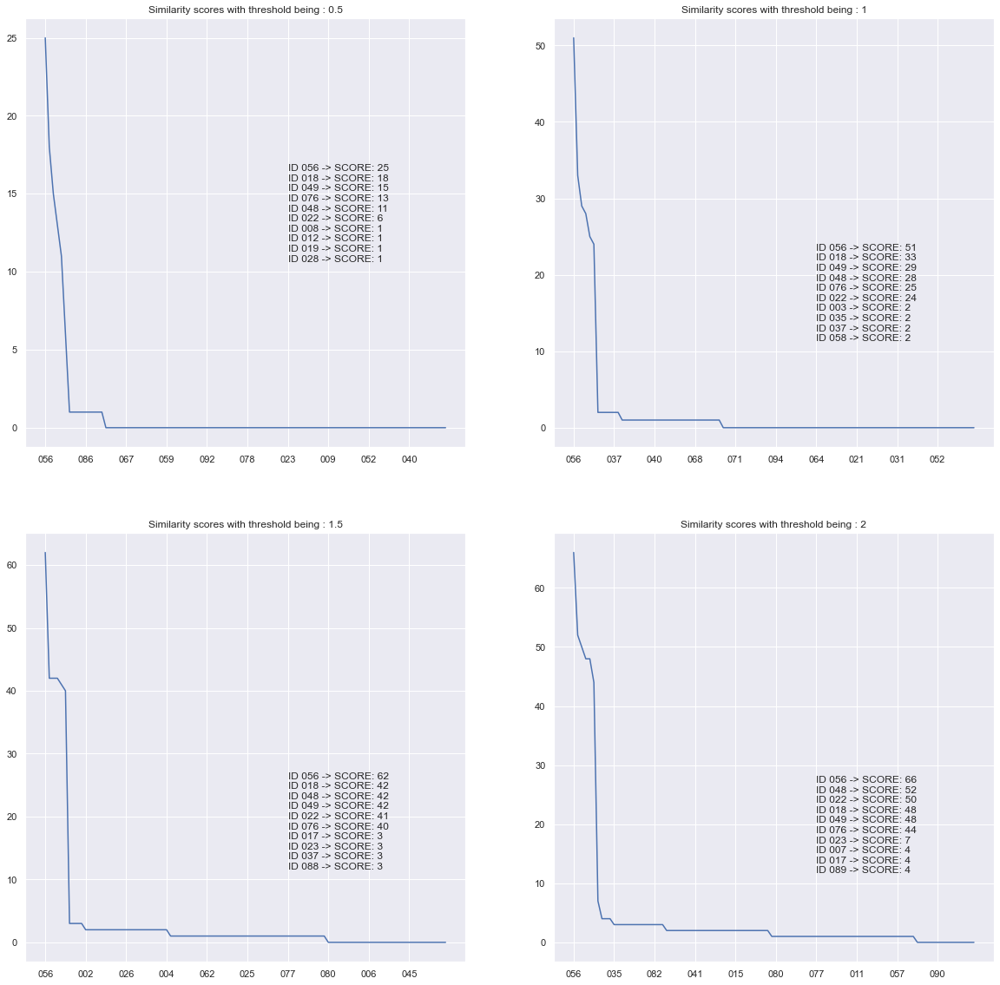

In [69]:
fig, axs = plt.subplots((len(sim_tb_list))//3,(len(sim_tb_list))//3,figsize=(20,20))
thresholds = ["0.5","1","1.5","2","2.5","3"]

#iterate through axes
for i, ax in enumerate(fig.axes):
        sim = sim_tb_list[i].sort_values(by='score', ascending=False)
        ids,scores = sim.values[:,0],sim.values[:,1]
        ax.plot(ids,scores)
        ax.set_xticks(ids[np.arange(0,100,10)])
        ax.set_title("Similarity scores with threshold being : "+thresholds[i])
        ax.text(60, 10, sim_tb_text[i])
plt.savefig('report/images/comparison_thresh.png')




In [70]:
#normalize each similarity vector, and sort their values by descending values
sim_tb_norm = []
for i in range(len(sim_tb_list)):
    sim_tb_norm.append(((sim_tb_list[i]["score"] - sim_tb_list[i]["score"].min()) / (sim_tb_list[i]["score"].max() - sim_tb_list[i]["score"].min())).sort_values(ascending=False))

diff_top1_top2 = []
diff_top2_top3 = []

for i in range(0,4):
    diff_top1_top2.append(sim_tb_norm[i].iloc[0] - sim_tb_norm[i].iloc[1])
    diff_top2_top3.append(sim_tb_norm[i].iloc[1] - sim_tb_norm[i].iloc[2])

table = BeautifulTable()
table.rows.append([diff_top1_top2[0],diff_top1_top2[1],diff_top1_top2[2],diff_top1_top2[3]])
table.rows.append([diff_top2_top3[0],diff_top2_top3[1],diff_top2_top3[2],diff_top2_top3[3]])
table.rows.header = ["Top 1 - Top 2","Top 2 - Top 3"]
table.columns.header = ["Thresh = 0.5", "Thresh =1.0", "Thresh =1.5", "Thresh =2.0"]
print(table)

+---------------+--------------+-------------+-------------+-------------+
|               | Thresh = 0.5 | Thresh =1.0 | Thresh =1.5 | Thresh =2.0 |
+---------------+--------------+-------------+-------------+-------------+
| Top 1 - Top 2 |     0.28     |    0.353    |    0.323    |    0.212    |
+---------------+--------------+-------------+-------------+-------------+
| Top 2 - Top 3 |     0.12     |    0.078    |     0.0     |    0.03     |
+---------------+--------------+-------------+-------------+-------------+


### 5. Model extension 3: Hybrid features


Since we again run into the same problem of a lack of clear disctinction, we can now give hybrid features a shot.

#### 5.1 Hybrid Similarity metric
<div class="alert alert-block alert-success">
<b>Q5: </b> Choose a hybrid feature similarity function that makes use of both the geometric distance and the feature distance of the keypoints. Using this hybrid function, visualize and assess the matches.
</div>

What we will do here is follow the same scheme as we did with Global Features, except that we will also use the match distance as an additional threshold. This will allow to have a more robust feature representation.

In [71]:
def hybrid_img_similarity(matches, kp1_reg, kp2):
    best = []
    for match in matches:
        dist = distance.minkowski(kp1_reg[match.queryIdx].pt, kp2[match.trainIdx].pt,p=3)
        if dist < 1 and match.distance < 45:
            best.append(dist)
    return len(best)

#### 5.2 Construct hybrid similarity matrix


In [72]:
def hybrid_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size=kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size= kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # get source and target index for each match
    local_pt_source, local_pt_target = np.array([
        (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T
    
    # use matching keypoints to estimate an affine transform between keypoints
    M, inliers = estimate_affine_transform_by_kps(
        cv2.KeyPoint.convert(kp1[local_pt_source]), 
        cv2.KeyPoint.convert(kp2[local_pt_target]))
    
    # if no inliers can be found
    if M is None: 
        return 0
    
    # warp the keypoints according to the found transform
    kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
    
    # subset the keypoints, inliers are considered good keypoints
    # since they were used in finding the transformation
    global_k1_k2_matches = local_k1_k2_matches[inliers == 1]

     # compute hybrid similarity based on aligned matching keypoints
    return hybrid_img_similarity(global_k1_k2_matches, kp1_reg, kp2)
    
sim_tb_hybrid = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, hybrid_similarity)

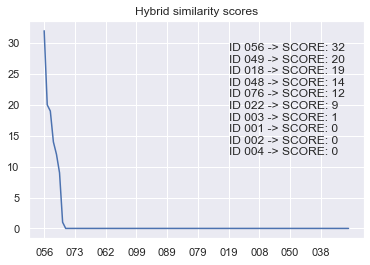

In [73]:
top_sim_tb_hybrid = transformTopScoresToText(sim_tb_hybrid, 10)  

sim = sim_tb_hybrid.sort_values(by='score', ascending=False)
ids,scores = sim.values[:,0],sim.values[:,1]
plt.plot(ids,scores)
plt.xticks(ids[np.arange(0,100,10)])
plt.title("Hybrid similarity scores")
plt.text(60, 10, top_sim_tb_hybrid)
plt.show()

Let's see how well the top matches are separated. 

In [74]:
#normalize similarity vector

sim_tb_hybrid_norm = ((sim_tb_hybrid["score"] - sim_tb_hybrid["score"].min()) / (sim_tb_hybrid["score"].max() - sim_tb_hybrid["score"].min())).sort_values(ascending=False)

diff_top1_top2 = sim_tb_hybrid_norm.iloc[0] - sim_tb_hybrid_norm.iloc[1]
diff_top2_top3 = sim_tb_hybrid_norm.iloc[1] - sim_tb_hybrid_norm.iloc[2]


table = BeautifulTable()
table.rows.append([diff_top1_top2])
table.rows.append([diff_top2_top3])
table.rows.header = ["Top 1 - Top 2","Top 2 - Top 3"]
table.columns.header = ["Hybrid features"]
print(table)

+---------------+-----------------+
|               | Hybrid features |
+---------------+-----------------+
| Top 1 - Top 2 |      0.375      |
+---------------+-----------------+
| Top 2 - Top 3 |      0.031      |
+---------------+-----------------+


Oh no! Still no clear distinction... This is suspicious, let's take a look at the best matching fingerprints.

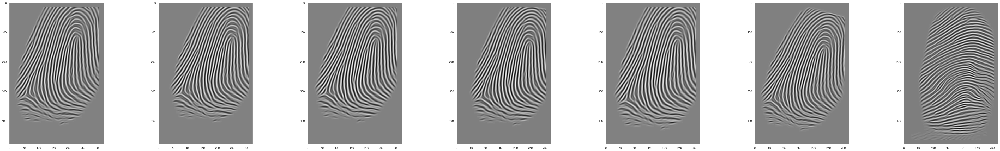

In [75]:
def get_image_by_label(ind):
    for i in range(len(labels_db)):
        if labels_db[i] == ind:
            return images_enhanced_db[i]
            
    raise ValueError("No image with this label is found.")

imgs = [get_image_by_label(i) for i in ids[:kneedle.knee]]

plot_image_sequence(imgs,kneedle.knee if kneedle.knee<=7 else 7)

The top matching subjects all have the same fingerprint! The murderer must have hacked the database and replicated some of the images, effectively covering their tracks. They seem to be one step ahead all the time... Or so they think! Fingerprints are not the only biometric you can evaluate.

You call your friends at CSI New York and send them the video surveillance records. By making use of the revolutionary (and non-existent) technology of ***zoom-and-enhance***, they return to you a database of iris images.

![Zoom and Enhance](img/csi_zoom_enhance.gif)

## III. Iris recognition
Now let's create a biometric system for the iris data. 

In [77]:
ls

 Le volume dans le lecteur C s'appelle Windows-SSD
 Le num‚ro de s‚rie du volume est C044-07F5

 R‚pertoire de C:\Users\deniz\OneDrive - KU Leuven\Documents\Master_AI_KUL\second_semester\biometrics\assignements\assignments\assignment2\assignment2

29/04/2022  14:12    <DIR>          .
29/04/2022  14:12    <DIR>          ..
19/04/2022  23:00    <DIR>          .ipynb_checkpoints
22/04/2022  22:54    <DIR>          __pycache__
29/04/2022  14:12        13ÿ565ÿ716 assingment_2_2022.ipynb
01/12/2021  22:00    <DIR>          data
23/04/2022  11:43        30ÿ720ÿ257 images_masks_db.pkl
01/12/2021  22:00    <DIR>          img
23/04/2022  17:38        20ÿ000ÿ255 iris_mask_db.pkl
27/04/2022  22:29    <DIR>          model
25/04/2022  15:30    <DIR>          palmprint
27/04/2022  17:49           466ÿ785 paper_comparing_similarity_metrics.pdf
23/11/2021  15:28           148ÿ445 perpetrator_fp.png
17/11/2021  17:40            90ÿ678 perpetrator_iris.bmp
27/04/2022  19:10    <DIR>          report
01/1

In [78]:
# set path
# CHANGE THIS FOR YOUR SYSTEM
iris_data_path = 'data/CASIA1'

### 1. Reading data

<div class="alert alert-block alert-success">
<b>Q6: </b> Check out <code>iris_perpetrator.png</code>. Where do you see difficulties? What kind of similarity measures do you expect to work best?
</div>

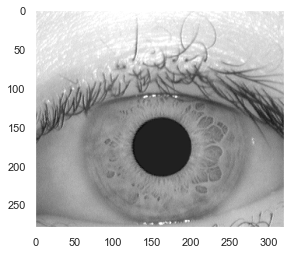

In [79]:
iris_perpetrator = cv2.cvtColor(cv2.imread("perpetrator_iris.bmp"),cv2.COLOR_BGR2GRAY)
plt.grid(False)
plt.imshow(iris_perpetrator,cmap='gray')
plt.savefig('report/images/perpetrator_iris.png')


Let's read the iris data... The images are stored as XXX.png, where XXX stands for the unique identifier of subject, ranging from from 000 to 100.

In [80]:
def read_iris_DB(path):
    images = []
    labels = []
    imagePaths = sorted(os.listdir('data/CASIA1'))

    for imagePath in imagePaths:
        if imagePath.endswith('.png'):
            label = imagePath.split('.')[0]
            image = cv2.imread(path +'\\' + imagePath)

            if (len(image.shape) > 2):
                image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            images.append(image)
            labels.append(label)

    return np.array(images), np.array(labels)

# read iris Database
iris_images, iris_labels = read_iris_DB(iris_data_path)

# save data properties
n_images = len(iris_images)
img_height, img_width = iris_images[0].shape[0], iris_images[0].shape[1]

Markdown("""
Let's have a look at the dataset... It contains {} images of size of the images is {}×{}. Let's visualise the first 7:
""".format(n_images,img_height,img_width))


Let's have a look at the dataset... It contains 100 images of size of the images is 280×320. Let's visualise the first 7:


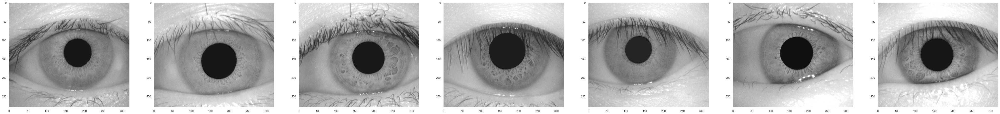

In [81]:
n = 7
plot_image_sequence(iris_images, n)

### 2. Biometric iris recogntion System
#### 2.1. Image enhancement
Similar to the image enhancement in the [fingerprints](#3.1.-Image-enhancements) section, we will use [open source code](https://github.com/thuyngch/Iris-Recognition) to segment (based on Daugman's intefro-differential) and normalise (by unwraping the circular region) the iris images. We strongly encourage you to go through the source code or github repository to learn more. 

Also similar to the fingerprint section we enhance the images using a gabor filter bank, this time we implement this using [OpenCV](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gae84c92d248183bd92fa713ce51cc3599). 

In [82]:
import warnings
warnings.filterwarnings('ignore')

from src.irismodules.iris_recognition.python.fnc import segment, normalize

# we use the same hyper parameters as in the enroll-casia1.py example
# feel free to play around with these!
eyelashes_thres = 150
radial_res = 200
angular_res = 500

def segment_iris(img):
    # Segment the iris region from the eye image. Indicate the noise region.
    ciriris, cirpupil, imwithnoise = segment.segment(img)

    # Normalize iris region by unwraping the circular region into a rectangular block of constant dimensions.
    polar_iris, mask = normalize.normalize(
        imwithnoise, ciriris[1], ciriris[0], ciriris[2], cirpupil[1], cirpupil[0], cirpupil[2], radial_res, angular_res)
    
    return polar_iris, (mask == 0)      

def get_filter_bank(ksize = 5,sigma = 4, theta_range = np.arange(0,np.pi,np.pi/16), lambd=10,gamma = 0.5,psi=0 ):
    # this filterbank comes from https://cvtuts.wordpress.com/
    filters = []
    for theta in theta_range:
        kern = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_32F)
        kern /= 1.5*kern.sum()
        filters.append(kern)
    return filters
    cv2.getGaborKernel()
def enhance_iris(img, eps = 1.e-15, agg_f = np.max):
    # get the gabor filters
    filters = get_filter_bank()

    # apply filters to image
    enhanced_image = np.array([cv2.filter2D(img, ddepth = -1, kernel=k) for k in filters])
    
    # Normalize in the [0,255] range
    enhanced_image = cv2.normalize(enhanced_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=0)
    
    # aggregate features
    return agg_f(enhanced_image,0)
    
def enhance_and_segment_irises(images):
    enhanced_images, masks = [], []
    for img in (images):
        normalised_img, mask = segment_iris(img)
        enhanced_img = enhance_iris(normalised_img)
        
        masks.append(mask)
        enhanced_images.append(enhanced_img)
    
    return np.array(enhanced_images), np.array(masks)

try:
    with open("iris_mask_db.pkl","rb") as f:
        enhanced_iris,mask_iris = pickle.load(f)
        print("File found : enhanced images and masks loaded")
except:
    print("File not found : enhanced images and masks are computed (it may take a while)")
    enhanced_iris, mask_iris = enhance_and_segment_irises(iris_images)
    with open("iris_mask_db.pkl","wb") as f:
        pickle.dump([enhanced_iris,mask_iris],f)
    

File found : enhanced images and masks loaded


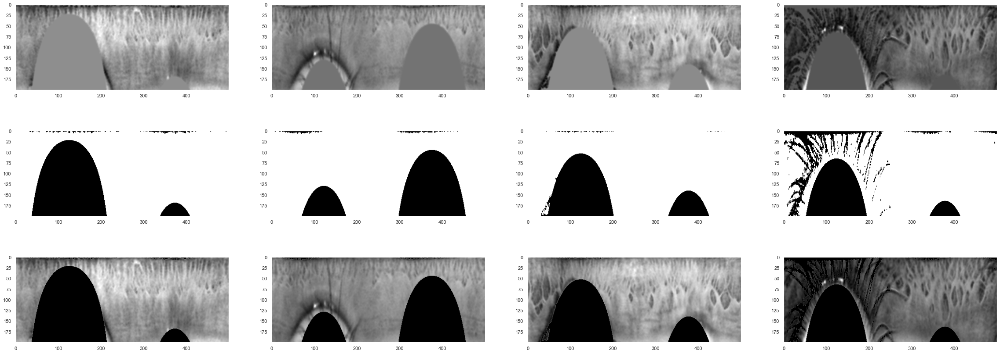

In [83]:
n=4


iris_segmented_db = np.array([a*b for a,b in zip(enhanced_iris, mask_iris)])
plot_image_sequence(enhanced_iris.tolist()[:n] + mask_iris.tolist()[:n] + iris_segmented_db.tolist()[:n], 3*n, n, figsize= (10,5), cmap='gray')

<div class="alert alert-block alert-success">
<b>Q7: </b> Construct a similarity table with the iris images. Use local OR global matches in order to get scores. Use the scores you get to determine the perpetrator.
</div>

In [84]:
iris_perpetrator_en, iris_perpetrator_mask = enhance_and_segment_irises([iris_perpetrator])
iris_perpetrator_en = iris_perpetrator_en[0]
iris_perpetrator_mask = iris_perpetrator_mask[0]

sim_tb_iris = constructSimilarityTable(np.stack((iris_perpetrator_en,iris_perpetrator_mask),-1), np.stack((iris_segmented_db,mask_iris),-1), iris_labels, local_similarity)

In [85]:
sim_tb_iris["score"] = sim_tb_iris["score"].round(4)
sim_tb_iris

,id,score
0,001,0.0155
1,002,0.0145
2,003,0.0362
3,004,0.0143
4,005,0.0134
...,...,...
95,096,0.0164
96,097,0.0166
97,098,0.0153
98,099,0.0150


<function matplotlib.pyplot.show(close=None, block=None)>

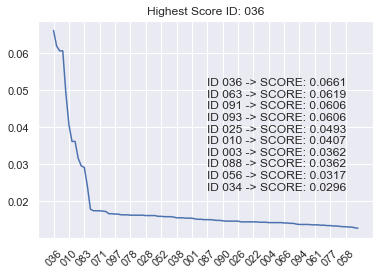

In [86]:
top_sim_tb_iris = transformTopScoresToText(sim_tb_iris, 10)  

sim_tb_iris = sim_tb_iris.sort_values(by='score', ascending=False)
ids,scores = sim_tb_iris.values[:,0],sim_tb_iris.values[:,1]
plt.plot(ids,scores)
plt.xticks(np.arange(0,100,5),ids[np.arange(0,100,5)],rotation = 45)
plt.text(50,0.02,top_sim_tb_iris)
plt.title('Highest Score ID: '+ids[0])
plt.savefig('report/images/irs_scores.png')
plt.show


Let's see how well the top matches are separated :

In [87]:
#normalize similarity vector

sim_tb_iris_norm = ((sim_tb_iris["score"] - sim_tb_iris["score"].min()) / (sim_tb_iris["score"].max() - sim_tb_iris["score"].min())).sort_values(ascending=False)

diff_top1_top2 = sim_tb_iris_norm.iloc[0] - sim_tb_iris_norm.iloc[1]
diff_top2_top3 = sim_tb_iris_norm.iloc[1] - sim_tb_iris_norm.iloc[2]


table = BeautifulTable()
table.rows.append([diff_top1_top2])
table.rows.append([diff_top2_top3])
table.rows.header = ["Top 1 - Top 2","Top 2 - Top 3"]
table.columns.header = ["Iris scores"]
print(table)

+---------------+-------------+
|               | Iris scores |
+---------------+-------------+
| Top 1 - Top 2 |    0.079    |
+---------------+-------------+
| Top 2 - Top 3 |    0.024    |
+---------------+-------------+


How is this possible? Iris scans don't provide a clear suspect either. 

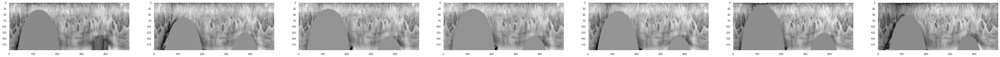

In [88]:
def get_iris_image_by_label(ind):
    for i in range(len(iris_labels)):
        if iris_labels[i] == ind:
            return enhanced_iris[i]
    raise ValueError("No image with this label is found.")

imgs = [get_iris_image_by_label(i) for i in ids[:kneedle.knee]]

plot_image_sequence(imgs,kneedle.knee if kneedle.knee<=7 else 7)

They are all the same once again. There is no doubt about it now, there is an insider messing with the data! Lucky for us, but unlucky for them, they slipped up. We can now construct a multimodal biometric system in order to catch the perpetrator.

## IV Multimodal System

<div class="alert alert-block alert-success">
<b>Q8: </b> Fuse your iris and fingerprint biometric system on the score level to solve the murder case! Do you feel confident in your prediction? How do you fuse the scores? Why?
</div>



For multimodal biometrics, different method exist to fuse the individual biometrics : 

- Sensor level : Use multiple measurements / sensors
- Feature level : Use multiple features extraction methods
- Score level : Use multiple identifier to compute the score, then merge the score
- Decision level : Use multiple identifier that create a score, then create a decision. Take your decision based on the decision of the multiple identifiers

Here, we will fuse the biometric systems on the score level. We will use the hybrid features. We also need to normalize the values of the features before adding them.

To fuse the 2 biometric system, we will create a new score, based on a mean between the scores of the 2 systems. We will choose the weight to give to each score based on the results we get.    


In [122]:
sim_tb_fing = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, hybrid_similarity)
sim_tb_iris = constructSimilarityTable(np.stack((iris_perpetrator_en,iris_perpetrator_mask),-1), np.stack((iris_segmented_db,mask_iris),-1), iris_labels, hybrid_similarity)


#normalize score column (min-max normalization)

sim_tb_fing["score"]=(sim_tb_fing["score"]-sim_tb_fing["score"].min())/(sim_tb_fing["score"].max()-sim_tb_fing["score"].min())
sim_tb_iris["score"]=(sim_tb_iris["score"]-sim_tb_iris["score"].min())/(sim_tb_iris["score"].max()-sim_tb_iris["score"].min())

sim_tb_avg_40 = sim_tb_fing.copy()
sim_tb_avg_50 = sim_tb_fing.copy()
sim_tb_avg_60 = sim_tb_fing.copy()
sim_tb_avg_70 = sim_tb_fing.copy()


#we try for different proportion of fingerprint scores and iris scores 
sim_tb_avg_40["score"] = 0.4*sim_tb_fing["score"] + 0.6*sim_tb_iris["score"]
sim_tb_avg_50["score"] = 0.5*sim_tb_fing["score"] + 0.5*sim_tb_iris["score"]
sim_tb_avg_60["score"] = 0.6*sim_tb_fing["score"] + 0.4*sim_tb_iris["score"]
sim_tb_avg_70["score"] = 0.7*sim_tb_fing["score"] + 0.3*sim_tb_iris["score"]

#we sort the values
sim_tb_avg_40 = sim_tb_avg_40.sort_values(by='score', ascending=False)
sim_tb_avg_50 = sim_tb_avg_50.sort_values(by='score', ascending=False)
sim_tb_avg_60 = sim_tb_avg_60.sort_values(by='score', ascending=False)
sim_tb_avg_70 = sim_tb_avg_70.sort_values(by='score', ascending=False)



,id,score
55,056,0.773770
48,049,0.437500
17,018,0.415625
47,048,0.306250
62,063,0.300000
...,...,...
36,037,0.000000
34,035,0.000000
32,033,0.000000
31,032,0.000000


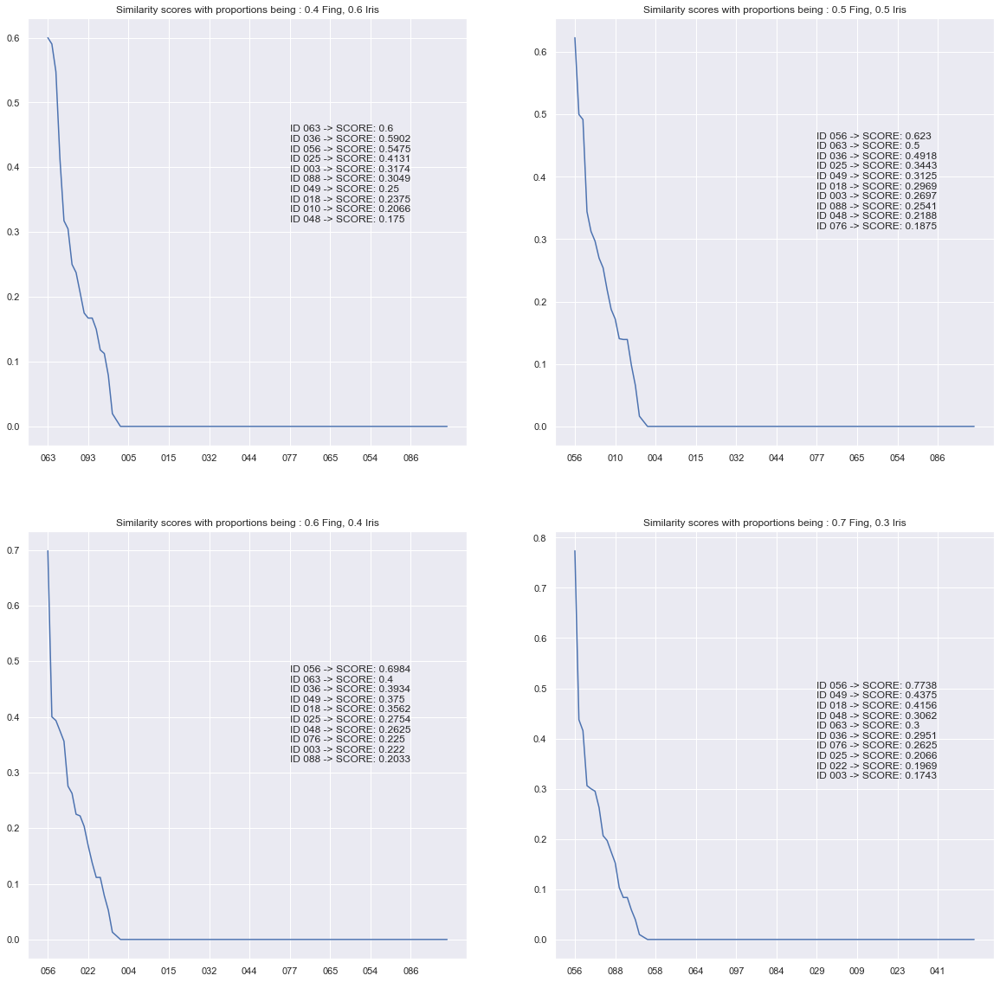

In [149]:
sim_tb_list = [sim_tb_avg_40,sim_tb_avg_50,sim_tb_avg_60,sim_tb_avg_70]
sim_tb_text = simb_tb_list.copy()

for i in range(0,len(sim_tb_list)):
    sim_tb_list[i]["score"]= sim_tb_list[i]["score"].round(4)
    sim_tb_text[i] = transformTopScoresToText(sim_tb_list[i], 10)  
fig, axs = plt.subplots((len(sim_tb_list))//2,(len(sim_tb_list))//2,figsize=(20,20))
proportions = ["0.4 Fing, 0.6 Iris","0.5 Fing, 0.5 Iris","0.6 Fing, 0.4 Iris","0.7 Fing, 0.3 Iris"]

#iterate through axes
for i, ax in enumerate(fig.axes):
        sim = sim_tb_list[i].sort_values(by='score', ascending=False)
        ids,scores = sim.values[:,0],sim.values[:,1]
        ax.plot(ids,scores)
        ax.set_xticks(ids[np.arange(0,100,10)])
        ax.set_title("Similarity scores with proportions being : "+proportions[i])
        ax.text(60, 0.3, sim_tb_text[i])
plt.savefig('report/images/comparison_multimod.png')
plt.show()


As we always did through the assignment, let's look to the separation between the top matching scores : 

In [147]:
#normalize each similarity vector, and sort their values by descending values
sim_tb_norm = []
for i in range(len(sim_tb_list)):
    sim_tb_norm.append(((sim_tb_list[i]["score"] - sim_tb_list[i]["score"].min()) / (sim_tb_list[i]["score"].max() - sim_tb_list[i]["score"].min())).sort_values(ascending=False))

diff_top1_top2 = []
diff_top2_top3 = []

for i in range(0,4):
    diff_top1_top2.append(sim_tb_norm[i].iloc[0] - sim_tb_norm[i].iloc[1])
    diff_top2_top3.append(sim_tb_norm[i].iloc[1] - sim_tb_norm[i].iloc[2])

table = BeautifulTable()
table.rows.append([diff_top1_top2[0],diff_top1_top2[1],diff_top1_top2[2],diff_top1_top2[3]])
table.rows.append([diff_top2_top3[0],diff_top2_top3[1],diff_top2_top3[2],diff_top2_top3[3]])
table.rows.header = ["Top1-Top2","Top2-Top3"]
table.columns.header = ["0.4 Fing, 0.6 Iris","0.5 Fing, 0.5 Iris","0.6 Fing, 0.4 Iris","0.7 Fing, 0.3 Iris"]
print(table)

+--------------+---------------+---------------+---------------+---------------+
|              | 0.4 Fing, 0.6 | 0.5 Fing, 0.5 | 0.6 Fing, 0.4 | 0.7 Fing, 0.3 |
|              |      Iris     |      Iris     |      Iris     |      Iris     |
+--------------+---------------+---------------+---------------+---------------+
|  Top1-Top2   |     0.016     |     0.197     |     0.427     |     0.435     |
+--------------+---------------+---------------+---------------+---------------+
|  Top2-Top3   |     0.071     |     0.013     |     0.009     |     0.028     |
+--------------+---------------+---------------+---------------+---------------+


## V. Assignment Instructions
Both a report and the implementation in this notebook have to be submitted to toledo. <u>The notebook functions as supplementary material only!</u> The report should be self contained. Feel free to add figures, code and mathematics in the report if you feel comfortable. Try to be concice and to the point and try keep your report below 10 pages. 

1. Follow the instructions in the notebook and discuss results/impact in your report.
2. <b>Choose a number of tasks equivalent to <u>at least 6pts</u> from the list below (pts are not related to the grades): </b>
    1. [FING and IRIS] OpenCV provides different KeyPoint detectors and descriptors (ORB, SIFT, SURF, BRIEF, ...). Briefly test, visually, which of these seem to extract relatively reliable interesting points from the fingerprints or iris dataset (you can skip the ones that require a lisence). Use <u> at least 3 detectors</u>. (1pt)
    2. [IRIS] Play around with the gabor filter bank, what is the effect of the parameters? Can you setup a databank that results in better features? (1pt)
    3. [FING] Can you find a better way to aggregate the gabor feature maps? Analyse and report. (1pt) 
    4. [IRIS] Compare local hybrid and global features for the iris data (1pt).
    5. [FING] Try a neural network approach in order to get similarity scores directly from image data without feature extraction. (1pt)
    6. [FING] Attempt to improve the registration procedure. (1pt) 
    7. [FING or IRIS] Attempt to improve the segmentation, evaluate. (3pt) 
    8. [FING or IRIS] Attempt to improve the feature extraction using a completely different technique. Evaluate your results. (3pt)
    9. [MULTI] Fuse your modalities on the feature level instead of the score level (3pt)
    10. [ . ] Create a biometric identification or authentication system on a modality of choice and evaluate it (6pt)
        - e.g. on smartphone usage patterns 
        - Excludes; Fingerprints, irises and faces
    11. [FING or IRIS] Create a machine learning based identification/authentication system and evaluate it (6pt)
        - e.g. based on deep learning 
        - training is required, transfer learning is allowed 
3. All results should be discussed in detail in your report. 


<em>Note: Indicate clearly which tasks you end up choosing and where we can find the implementations and/or results. </em> <br>
<em>Note 2: Usually there are multiple valid solutions, you should always defend your approach and verbally compare it to the other approaches (possible advantages/disadvantages) in your report! If you do not provide proper reasoning we can not give you the grades you deserve! </em>

Good luck, have fun!


## VI Additional tasks

### [ . ] Create a biometric identification or authentication system on a modality of choice and evaluate it (6pt)

For this part, we will develop a **Contact Less Palm recognition system**. The dataset we will use is available at [this website](https://cslinzhang.github.io/ContactlessPalm/?fbclid=IwAR27ef6k9NEFq-bAkQVV63rRy-PZM0P7uQdCrwWIQjO2JBABT3jql48Hk9k). Note that the authors have published 2 different datasets : one *original* dataset for raw images, one *roi* dataset for images where the palm have been detected and the different palms have been aligned. For the sake of simplicity, we will do our system based on the *roi* dataset. For the ones interested on how to extract the *roi* from the *raw* images, the authors have given a comprehensive explanation in [their paper](https://cslinzhang.github.io/ContactlessPalm/contactlesspalm.pdf).

We will also use some of the functions that were used for the fingeprint and iris part of this assignment.

#### First, let's get the dataset

The ROI dataset can be downloaded on [drive](https://drive.google.com/file/d/1KZCXi6zAk5mZ1nQHFdeYHboAII3DOjls/view). There are 2 subfolders : session 1 and session 2, corresponding to 2 sessions of measurements. Each subfolder contain 6000 images corresponding to 600 different palms : 

- images id from 00001.bmp to 00010.bmp correspond to identity 1
- images id from 00011.bmp to 00020.bmp correspond to identity 2
- images id from 00021.bmp to 00030.bmp correspond to identity 3
- ...
- images id from 05991.bmp to 06000.bmp correspond to identity 600


Due to limited computation capacity, we will not use the whole dataset, but only the first 100 identities (images from 00001.bmp to 01000.bmp). We will use data from the 2 sessions. So at the end, our dataset can be defined as : 

- having 100 identities
- each identity has 10 images from each session, so each identity has 20 images
- the total size of the dataset is 2000

In [151]:
def read_DB_palm(path):
    images = []
    labels = []
    imagePaths = sorted(Path(path).rglob("*.bmp"))
    for imagePath in (imagePaths):
        image = cv2.imread(path + imagePath.name)
        if (len(image.shape) > 2):
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        images.append(image)
        #label rule :
            #identity 1 if image name from 00001.bmp to 00010.bmp 
            #identity 2 if image name from 00011.bmp to 00020.bmp
        label = (int(imagePath.stem)-1)//10
        labels.append(label)
    return (images, labels)
    

# Read the fingerprint database of session 1 
images_db_palm, labels_db_palm = read_DB_palm('palmprint/data/session1/')
images_db_palm = images_db_palm[:1000]
labels_db_palm = labels_db_palm[:1000]


# Read the fingerprint database of session 2
images_db_palm_2, labels_db_palm_2 = read_DB_palm('palmprint/data/session2/')
images_db_palm_2 = images_db_palm_2[:1000]
labels_db_palm_2 = labels_db_palm_2[:1000]


#concatenate the 2 sessions
images_db_palm = images_db_palm + images_db_palm_2
labels_db_palm = labels_db_palm + labels_db_palm_2

# Save some metadata
n_imgs = len(images_db_palm)
img_height, img_width = images_db_palm[0].shape

Markdown(f"""Here are some samples from the database, which contains {n_imgs} images of size {img_height}x{img_width}. Remember, visualization is always a good idea, so let's visualize some""")

Here are some samples from the database, which contains 2000 images of size 128x128. Remember, visualization is always a good idea, so let's visualize some

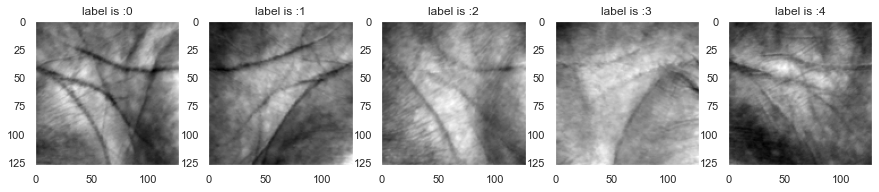

In [155]:
i = 3

f,ax = plt.subplots(1,5, figsize=(15,10))

for j in range (0,5):
    ax[j].imshow(images_db_palm[i+j*10], cmap='gray')
    ax[j].set_title("label is :" + str(labels_db_palm[i+j*10]))
    ax[j].grid(False)
plt.savefig('report/images/palm.png')
plt.show()

#### What are the features in a palmprint ?

As in fingerprint with edges, valleys, minutiae etc, palmprint has also unique features among individuals. 

The features are .....


see paper https://link.springer.com/referenceworkentry/10.1007/978-0-387-73003-5_266

#### Feature extraction

Which features are we going to use to recognize the palmprints ? Different method exist, inspire by IrisCode of Daugman. The most popular methods for palmprint recognition  are [PalmCode](https://ieeexplore.ieee.org/document/1410434), [CompCode](https://ieeexplore.ieee.org/abstract/document/1334184). Other more classical feature extraction methods such as [SIFT](https://ieeexplore.ieee.org/document/5634472) have also been used. In general, authors use SIFT features to fuse the scores of their method with the scores of the SIFT features to have a more robust system.

Because I already have try SIFT features etc on the first part of this assignment, I wanted to do something different : Deep Learning based approaches. CNN with triplet loss have already been applied successfully on palm print recognition (see [paper](https://ieeexplore.ieee.org/document/8963760)). 

We will use the [Triplet loss implementation](https://www.tensorflow.org/addons/tutorials/losses_triplet) of Tensorflow. We will also use some part of the implementation of [Adrian-Stefan Ungureanu
](https://github.com/AdrianUng/keras-triplet-loss-mnist)

#### Prepare the data for Tensorflow

Instead of working with a list of arrays, let's work with a 3D array of dimensions (number_samples, img_width, img_height)



In [179]:
import numpy as np


df_palm = np.stack(images_db_palm)
labels_palm = np.array(labels_db_palm)

print(df_palm.shape, labels_palm.shape)

(2000, 128, 128) (2000,)


Let's also divide the data into train and validation

In [180]:
print(df_palm.shape)

(2000, 128, 128)


In [181]:
from sklearn.model_selection import train_test_split


df_palm = df_palm/255

x_train, x_val, y_train, y_val = train_test_split(df_palm, labels_palm, test_size=0.20, random_state=42,stratify = labels_palm)

#### Definition of the network

The network should be able to learn embeddings of the images in a robust way : translation, rotation (even if the images have been aligned), illumination changes should not have a big impact on the embedding created from the network.
Thus, using CNN is well suited.

The CNN will output a feature vector representing the image, called **embedding**. The purpose of using *Triplet Loss* is to have well separated emebedding between different classes.

In [195]:
from tensorflow.keras.layers import Dense, Flatten,Dropout, Conv2D, MaxPool2D,BatchNormalization,Input,concatenate
import tensorflow.keras as keras
import tensorflow as tf

image_input_shape = (img_height,img_height,1)
embedding_size = 200

def cnn(image_input_shape, embedding_size):
    
    input_image = Input(shape=image_input_shape)
    x = Conv2D(32,5, activation='relu')(input_image)
    x = MaxPool2D(2)(x)
    x = Conv2D(64,5, activation='relu')(x)
    x = MaxPool2D(2)(x)
    x = Conv2D(128,3, activation='relu')(x)
    x = MaxPool2D(2)(x)
    x = Flatten()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.4)(x)
    x = Dense(embedding_size)(x)
    
    cnn = keras.Model(inputs=input_image, outputs=x)
    
    return cnn

In [196]:
## required for semi-hard triplet loss:
from tensorflow.python.ops import array_ops
from tensorflow.python.ops import math_ops
from tensorflow.python.framework import dtypes
import tensorflow as tf

def pairwise_distance(feature, squared=False):
    """Computes the pairwise distance matrix with numerical stability.

    output[i, j] = || feature[i, :] - feature[j, :] ||_2

    Args:
      feature: 2-D Tensor of size [number of data, feature dimension].
      squared: Boolean, whether or not to square the pairwise distances.

    Returns:
      pairwise_distances: 2-D Tensor of size [number of data, number of data].
    """
    pairwise_distances_squared = math_ops.add(
        math_ops.reduce_sum(math_ops.square(feature), axis=[1], keepdims=True),
        math_ops.reduce_sum(
            math_ops.square(array_ops.transpose(feature)),
            axis=[0],
            keepdims=True)) - 2.0 * math_ops.matmul(feature,
                                                    array_ops.transpose(feature))

    # Deal with numerical inaccuracies. Set small negatives to zero.
    pairwise_distances_squared = math_ops.maximum(pairwise_distances_squared, 0.0)
    # Get the mask where the zero distances are at.
    error_mask = math_ops.less_equal(pairwise_distances_squared, 0.0)

    # Optionally take the sqrt.
    if squared:
        pairwise_distances = pairwise_distances_squared
    else:
        pairwise_distances = math_ops.sqrt(
            pairwise_distances_squared + math_ops.to_float(error_mask) * 1e-16)

    # Undo conditionally adding 1e-16.
    pairwise_distances = math_ops.multiply(
        pairwise_distances, math_ops.to_float(math_ops.logical_not(error_mask)))

    num_data = array_ops.shape(feature)[0]
    # Explicitly set diagonals to zero.
    mask_offdiagonals = array_ops.ones_like(pairwise_distances) - array_ops.diag(
        array_ops.ones([num_data]))
    pairwise_distances = math_ops.multiply(pairwise_distances, mask_offdiagonals)
    return pairwise_distances

def masked_maximum(data, mask, dim=1):
    """Computes the axis wise maximum over chosen elements.

    Args:
      data: 2-D float `Tensor` of size [n, m].
      mask: 2-D Boolean `Tensor` of size [n, m].
      dim: The dimension over which to compute the maximum.

    Returns:
      masked_maximums: N-D `Tensor`.
        The maximized dimension is of size 1 after the operation.
    """
    axis_minimums = math_ops.reduce_min(data, dim, keepdims=True)
    masked_maximums = math_ops.reduce_max(
        math_ops.multiply(data - axis_minimums, mask), dim,
        keepdims=True) + axis_minimums
    return masked_maximums

def masked_minimum(data, mask, dim=1):
    """Computes the axis wise minimum over chosen elements.

    Args:
      data: 2-D float `Tensor` of size [n, m].
      mask: 2-D Boolean `Tensor` of size [n, m].
      dim: The dimension over which to compute the minimum.

    Returns:
      masked_minimums: N-D `Tensor`.
        The minimized dimension is of size 1 after the operation.
    """
    axis_maximums = math_ops.reduce_max(data, dim, keepdims=True)
    masked_minimums = math_ops.reduce_min(
        math_ops.multiply(data - axis_maximums, mask), dim,
        keepdims=True) + axis_maximums
    return masked_minimums

def triplet_loss_adapted_from_tf(y_true, y_pred):
    del y_true
    margin = 1.
    labels = y_pred[:, :1]

 
    labels = tf.cast(labels, dtype='int32')

    embeddings = y_pred[:, 1:]

    ### Code from Tensorflow function [tf.contrib.losses.metric_learning.triplet_semihard_loss] starts here:
    
    # Reshape [batch_size] label tensor to a [batch_size, 1] label tensor.
    # lshape=array_ops.shape(labels)
    # assert lshape.shape == 1
    # labels = array_ops.reshape(labels, [lshape[0], 1])

    # Build pairwise squared distance matrix.
    pdist_matrix = pairwise_distance(embeddings, squared=True)
    # Build pairwise binary adjacency matrix.
    adjacency = math_ops.equal(labels, array_ops.transpose(labels))
    # Invert so we can select negatives only.
    adjacency_not = math_ops.logical_not(adjacency)

    # global batch_size  
    batch_size = array_ops.size(labels) # was 'array_ops.size(labels)'

    # Compute the mask.
    pdist_matrix_tile = array_ops.tile(pdist_matrix, [batch_size, 1])
    mask = math_ops.logical_and(
        array_ops.tile(adjacency_not, [batch_size, 1]),
        math_ops.greater(
            pdist_matrix_tile, array_ops.reshape(
                array_ops.transpose(pdist_matrix), [-1, 1])))
    mask_final = array_ops.reshape(
        math_ops.greater(
            math_ops.reduce_sum(
                math_ops.cast(mask, dtype=dtypes.float32), 1, keepdims=True),
            0.0), [batch_size, batch_size])
    mask_final = array_ops.transpose(mask_final)

    adjacency_not = math_ops.cast(adjacency_not, dtype=dtypes.float32)
    mask = math_ops.cast(mask, dtype=dtypes.float32)

    # negatives_outside: smallest D_an where D_an > D_ap.
    negatives_outside = array_ops.reshape(
        masked_minimum(pdist_matrix_tile, mask), [batch_size, batch_size])
    negatives_outside = array_ops.transpose(negatives_outside)

    # negatives_inside: largest D_an.
    negatives_inside = array_ops.tile(
        masked_maximum(pdist_matrix, adjacency_not), [1, batch_size])
    semi_hard_negatives = array_ops.where(
        mask_final, negatives_outside, negatives_inside)

    loss_mat = math_ops.add(margin, pdist_matrix - semi_hard_negatives)

    mask_positives = math_ops.cast(
        adjacency, dtype=dtypes.float32) - array_ops.diag(
        array_ops.ones([batch_size]))

    # In lifted-struct, the authors multiply 0.5 for upper triangular
    #   in semihard, they take all positive pairs except the diagonal.
    num_positives = math_ops.reduce_sum(mask_positives)

    semi_hard_triplet_loss_distance = math_ops.truediv(
        math_ops.reduce_sum(
            math_ops.maximum(
                math_ops.multiply(loss_mat, mask_positives), 0.0)),
        num_positives,
        name='triplet_semihard_loss')
    
    ### Code from Tensorflow function semi-hard triplet loss ENDS here.
    return semi_hard_triplet_loss_distance

In [197]:
from tensorflow.keras import Model

base_network = cnn(image_input_shape, embedding_size)

input_images = Input(shape=image_input_shape, name='input_image') # input layer for images
input_labels = Input(shape=(1,), name='input_label')    # input layer for labels
embeddings = base_network([input_images])               # output of network -> embeddings
labels_plus_embeddings = concatenate([input_labels, embeddings])  # concatenating the labels + embeddings

# Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
model = Model(inputs=[input_images, input_labels],
            outputs=labels_plus_embeddings)

In [199]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

#ps : we have to choose a quite high batch size to the number of classes (we have 100 classes)
#the batch size should be at least higher than 100 to avoid nan losses

opt = Adam()  # choose optimiser. RMS is good too!
model.compile(loss=triplet_loss_adapted_from_tf, 
              optimizer=opt)


reduce_lr = ReduceLROnPlateau(monitor='val_loss',      
                            factor=0.7,
                            patience=10,
                            verbose=1)

#save best weights
checkpoint = ModelCheckpoint(filepath = 'model/checkpoint_best', 
                    monitor='val_loss',           
                    save_best_only=True,
                    save_weights_only=True,
                    verbose=1)



# Uses 'dummy' embeddings + dummy gt labels; removed as soon as they enter the loss function...
dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
dummy_gt_val = np.zeros((len(x_val), embedding_size + 1))

H = model.fit(x=[x_train,y_train],
            y=dummy_gt_train,
            batch_size=200,
            epochs=150,
            validation_data=([x_val, y_val], dummy_gt_val),
            callbacks = [reduce_lr,checkpoint])

Epoch 1/150
8/8 [==============================] - 3s 264ms/step - loss: 0.4820 - val_loss: 0.4203

Epoch 00001: val_loss improved from inf to 0.42033, saving model to model\checkpoint_best
Epoch 2/150
8/8 [==============================] - 2s 249ms/step - loss: 0.4655 - val_loss: 0.4962

Epoch 00002: val_loss did not improve from 0.42033
Epoch 3/150
8/8 [==============================] - 2s 249ms/step - loss: 0.5017 - val_loss: 0.4251

Epoch 00003: val_loss did not improve from 0.42033
Epoch 4/150
8/8 [==============================] - 2s 249ms/step - loss: 0.4194 - val_loss: 0.4096

Epoch 00004: val_loss improved from 0.42033 to 0.40961, saving model to model\checkpoint_best
Epoch 5/150
8/8 [==============================] - 2s 249ms/step - loss: 0.4190 - val_loss: 0.4228

Epoch 00005: val_loss did not improve from 0.40961
Epoch 6/150
8/8 [==============================] - 2s 250ms/step - loss: 0.4394 - val_loss: 0.4082

Epoch 00006: val_loss improved from 0.40961 to 0.40816, saving 

8/8 [==============================] - 2s 250ms/step - loss: 0.2482 - val_loss: 0.1055

Epoch 00049: val_loss improved from 0.11698 to 0.10551, saving model to model\checkpoint_best
Epoch 50/150
8/8 [==============================] - 2s 265ms/step - loss: 0.2369 - val_loss: 0.1135

Epoch 00050: val_loss did not improve from 0.10551
Epoch 51/150
8/8 [==============================] - 2s 250ms/step - loss: 0.2503 - val_loss: 0.1147

Epoch 00051: val_loss did not improve from 0.10551
Epoch 52/150
8/8 [==============================] - 2s 252ms/step - loss: 0.2544 - val_loss: 0.0979

Epoch 00052: val_loss improved from 0.10551 to 0.09792, saving model to model\checkpoint_best
Epoch 53/150
8/8 [==============================] - 2s 259ms/step - loss: 0.1986 - val_loss: 0.0756

Epoch 00053: val_loss improved from 0.09792 to 0.07557, saving model to model\checkpoint_best
Epoch 54/150
8/8 [==============================] - 2s 250ms/step - loss: 0.2083 - val_loss: 0.0735

Epoch 00054: val_loss i

8/8 [==============================] - 2s 250ms/step - loss: 0.0679 - val_loss: 0.0135

Epoch 00097: val_loss did not improve from 0.00503
Epoch 98/150
8/8 [==============================] - 2s 265ms/step - loss: 0.0693 - val_loss: 0.0102

Epoch 00098: val_loss did not improve from 0.00503
Epoch 99/150
8/8 [==============================] - 2s 250ms/step - loss: 0.0915 - val_loss: 0.0096

Epoch 00099: val_loss did not improve from 0.00503
Epoch 100/150
8/8 [==============================] - 2s 250ms/step - loss: 0.0759 - val_loss: 0.0104

Epoch 00100: val_loss did not improve from 0.00503
Epoch 101/150
8/8 [==============================] - 2s 270ms/step - loss: 0.0726 - val_loss: 0.0178

Epoch 00101: val_loss did not improve from 0.00503
Epoch 102/150
8/8 [==============================] - 2s 294ms/step - loss: 0.0797 - val_loss: 0.0127

Epoch 00102: val_loss did not improve from 0.00503
Epoch 103/150
8/8 [==============================] - 2s 257ms/step - loss: 0.0717 - val_loss: 0.01

8/8 [==============================] - 2s 264ms/step - loss: 0.0439 - val_loss: 0.0062

Epoch 00148: val_loss did not improve from 0.00252
Epoch 149/150
8/8 [==============================] - 2s 264ms/step - loss: 0.0409 - val_loss: 0.0118

Epoch 00149: val_loss did not improve from 0.00252
Epoch 150/150
8/8 [==============================] - 2s 264ms/step - loss: 0.0476 - val_loss: 0.0073

Epoch 00150: val_loss did not improve from 0.00252


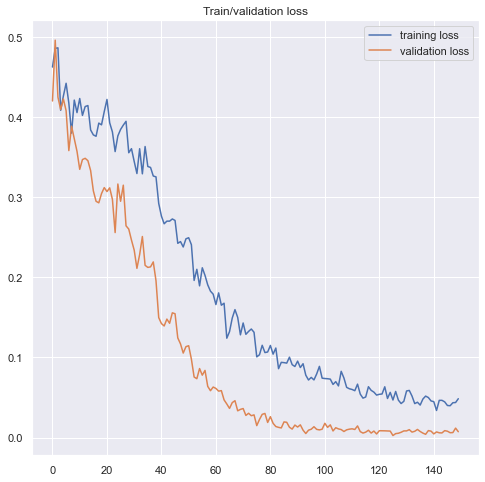

In [200]:
plt.figure(figsize=(8,8))
plt.plot(H.history['loss'], label='training loss')
plt.plot(H.history['val_loss'], label='validation loss')
plt.legend()
plt.title('Train/validation loss')
plt.show()

We can make different observations from the curves :

- The losses are very unstable at the first epochs. However, this should not alarm us : it just means that the landscape of the loss function, at the initialized weights, is very steep, and the initial learning rate is too big compared to that.
- The validation loss is lower than the training accuracy : it can be explained from the fact that the validation samples are easier to separate well compared to the training ones

In [201]:
    # Test the network

# creating an empty network
testing_embeddings = cnn(image_input_shape,
                                         embedding_size=embedding_size)
x_embeddings_before_train = testing_embeddings.predict(np.reshape(x_val, (len(x_val), img_width, img_height, 1)))
# Grabbing the weights from the trained network
for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
        weights = layer_source.get_weights()
        layer_target.set_weights(weights)
        del weights

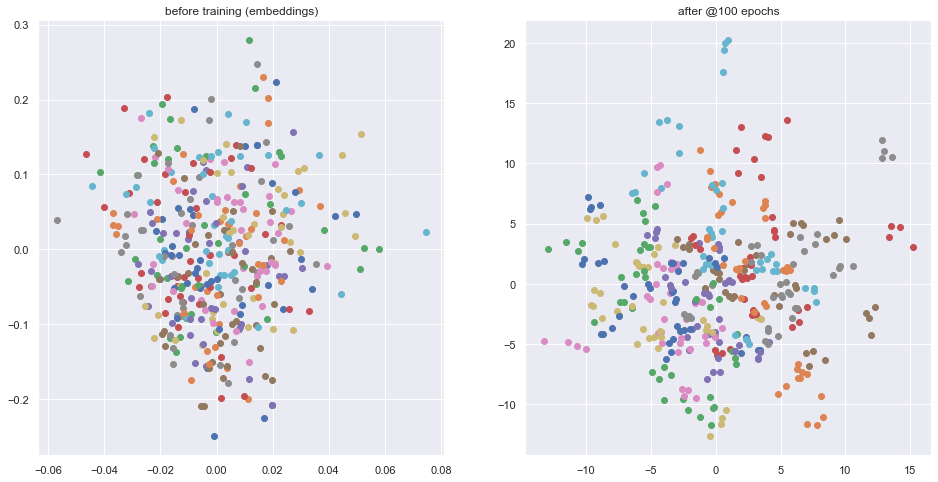

In [202]:
# Visualizing the effect of embeddings -> using PCA!

from sklearn.decomposition import PCA


x_embeddings = testing_embeddings.predict(np.reshape(x_val, (len(x_val), img_width, img_height, 1)))
dict_embeddings = {}
dict_gray = {}
test_class_labels = np.unique(np.array(y_val))

pca = PCA(n_components=2)
decomposed_embeddings = pca.fit_transform(x_embeddings)
decomposed_gray = pca.fit_transform(x_embeddings_before_train)

fig = plt.figure(figsize=(16, 8))
for label in test_class_labels:
    step = 1
    decomposed_embeddings_class = decomposed_embeddings[y_val == label]
    decomposed_gray_class = decomposed_gray[y_val == label]

    plt.subplot(1,2,1)
    plt.scatter(decomposed_gray_class[::step,1], decomposed_gray_class[::step,0],label=str(label))
    plt.title('before training (embeddings)')

    plt.subplot(1,2,2)
    plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label))
    plt.title('after @%d epochs' % 100)

plt.show()  

Even if the class are not well separable after 100 epoch, we can still see some clusters. 

Let's also keep in mind that we visualize the data in 2 dimensions, and we will apply non-linear classifier it.

To be really able to see if having the embeddings with triplet loss, let's compare the performance of an SVM on the data before applying our *triplet loss pipeline* and the performance of an SVM on the embedding obtained with the triplet loss.

In [203]:
from sklearn import svm

In [204]:
clf = svm.SVC()


x_train_to_train = x_train.reshape((x_train.shape[0],x_train.shape[1]*x_train.shape[2]))
x_val_to_train = x_val.reshape((x_val.shape[0],x_val.shape[1]*x_val.shape[2]))

clf.fit(x_train_to_train,y_train)

SVC()

In [205]:
#Predict the response for test dataset
y_pred = clf.predict(x_val_to_train)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_val, y_pred))

Accuracy: 0.89


After finding the embedding : 

In [206]:
x_embeddings_train = testing_embeddings.predict(np.reshape(x_train, (len(x_train), img_width, img_height, 1)))
x_embeddings_val = testing_embeddings.predict(np.reshape(x_val, (len(x_val), img_width, img_height, 1)))


In [207]:
clf = svm.SVC(probability=True)


clf.fit(x_embeddings_train,y_train)


#Predict the response for test dataset
y_pred = clf.predict(x_embeddings_val)
pred = clf.predict_proba(x_embeddings_val)
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_val, y_pred))

Accuracy: 0.9875


We can clearly see that our pipeline helps.

However, let's keep in mind that we are in a Biometrics Course. In an identification scenario, We should benchmark our model with plots such as the CMC curve

In the variable "*pred*", we have saved the prediction of the models for all the classes for each input label. We have 500 tests samples, with a dataset of 100 classes. So, the "*pred*" array has shape (500, 100).

For example, for the first input test sample, we will have an array of probabilities for each of the 100 classes. This will allow us to plot the CMC curve for example.

In [208]:
pred.shape

(400, 100)

In [209]:
pred[0]

array([0.00668882, 0.00633542, 0.00615847, 0.00617439, 0.00680682,
       0.00889295, 0.0084944 , 0.0091321 , 0.00803864, 0.0066233 ,
       0.00659212, 0.02023677, 0.00635418, 0.00665808, 0.00688955,
       0.00909136, 0.00640446, 0.01082906, 0.00692148, 0.00831874,
       0.00634756, 0.01125618, 0.00649597, 0.0064446 , 0.0086116 ,
       0.00841277, 0.01311153, 0.01002222, 0.00639045, 0.01192797,
       0.00816187, 0.00919358, 0.00742739, 0.00661965, 0.00656131,
       0.00652055, 0.01288971, 0.00625025, 0.0081082 , 0.02186166,
       0.00663728, 0.00636365, 0.00668075, 0.02770083, 0.00989288,
       0.00815291, 0.00883286, 0.00869933, 0.00654431, 0.01599075,
       0.00875387, 0.00899975, 0.00618696, 0.01259249, 0.00704253,
       0.00827395, 0.00724332, 0.00773948, 0.00617028, 0.00656327,
       0.01658239, 0.01434001, 0.00632214, 0.00670322, 0.00734735,
       0.01037337, 0.00659936, 0.00631047, 0.00641846, 0.01045117,
       0.00610555, 0.0062075 , 0.00653676, 0.00740986, 0.00625

Let's get the top accuracy to be able to plot the CMC. First let's sort the prediction in descending order.


In [210]:
predictions = pd.DataFrame(pred)
predictions

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.006689,0.006335,0.006158,0.006174,0.006807,0.008893,0.008494,0.009132,0.008039,0.006623,...,0.006961,0.007286,0.021839,0.133779,0.007129,0.006282,0.006166,0.006439,0.006213,0.007307
1,0.009386,0.012781,0.004700,0.011730,0.007048,0.008812,0.006975,0.007075,0.007597,0.182891,...,0.003605,0.012681,0.003616,0.004049,0.005098,0.016698,0.007016,0.006337,0.004898,0.004684
2,0.003952,0.003135,0.016083,0.008324,0.003143,0.004088,0.013192,0.006964,0.004576,0.003181,...,0.005603,0.003351,0.004216,0.003119,0.066060,0.009011,0.010329,0.003426,0.010048,0.003822
3,0.004005,0.003744,0.003704,0.007102,0.003349,0.009039,0.006074,0.011315,0.004230,0.019936,...,0.002964,0.015344,0.003329,0.004131,0.010426,0.041708,0.007966,0.004619,0.004659,0.010613
4,0.030269,0.009694,0.006734,0.007620,0.006208,0.006364,0.006320,0.004980,0.007037,0.020252,...,0.004896,0.005806,0.004997,0.005247,0.006425,0.008679,0.007107,0.023512,0.010508,0.007415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,0.004300,0.004108,0.003970,0.004675,0.004132,0.004880,0.005452,0.006355,0.006335,0.008962,...,0.004204,0.034713,0.004839,0.009406,0.009657,0.009169,0.005803,0.007329,0.005648,0.021819
396,0.012868,0.016991,0.008127,0.022896,0.007228,0.005088,0.006333,0.005061,0.008926,0.025998,...,0.004309,0.008366,0.004247,0.004373,0.005454,0.012851,0.014673,0.009193,0.008935,0.004426
397,0.008206,0.005152,0.003973,0.006054,0.005232,0.004818,0.009587,0.004808,0.025787,0.020709,...,0.003361,0.012894,0.003956,0.005864,0.007234,0.007611,0.004823,0.013782,0.006737,0.005258
398,0.008785,0.010317,0.030163,0.184778,0.006165,0.006225,0.015047,0.009924,0.007230,0.008250,...,0.003458,0.004982,0.002928,0.002949,0.012150,0.033050,0.029485,0.003807,0.008146,0.003089


In [211]:
maxValueIndex = predictions.idxmax(axis = 1)
print(maxValueIndex)

0      93
1       9
2      58
3      57
4      77
       ..
395    51
396    71
397    47
398     3
399    81
Length: 400, dtype: int64


In [212]:
predictions.shape[0]

400

In [213]:
#dataframe of recognized or not : if recognized, value = 1. Else, value = 0 
#the columnn is for the rank : from 0 to 1
#the row is for the particular subject_id
#so, for example, if at row 1 and rank 1, the value is 1, it means that it has been recognized
recognized_df = pd.DataFrame()

#first for loop to get through all row
#second for loop to test for rank from 1 to 100
for i in range(0,predictions.shape[0]):
    #we sort the row "i", from higher score to lower
    predictions_sorted = predictions.iloc[i].to_frame().sort_values(
    by=list(predictions.iloc[i].to_frame().columns),axis=0,ascending=False).transpose()
    #we save the actual label
    subject_id = y_val[i]
    #this list if for the "j" id with highest similarities 
    highest_similarities_id  = []
    for j in range(1,101):
        #for each "j", we append the highest similarity id
        #this list will then accumulates as "j" grows
        highest_similarities_id.append(predictions_sorted.columns[j-1])
        #if the subject id is in the list, we set the value of the corresponding dataframe cell to 1
        if subject_id in highest_similarities_id:
            recognized_df.at[i,j] =  1
        else:
            recognized_df.at[i,j] =  0

#we can now sum over all rows (subject_id)
#by dividing by matrix_length, we should get the recognition rate
recognition_rate = recognized_df.sum(axis=0)/predictions.shape[0]
print(recognition_rate)


1      0.9850
2      0.9925
3      0.9950
4      0.9975
5      0.9975
        ...  
96     1.0000
97     1.0000
98     1.0000
99     1.0000
100    1.0000
Length: 100, dtype: float64


Text(0, 0.5, 'Recognition Rate')

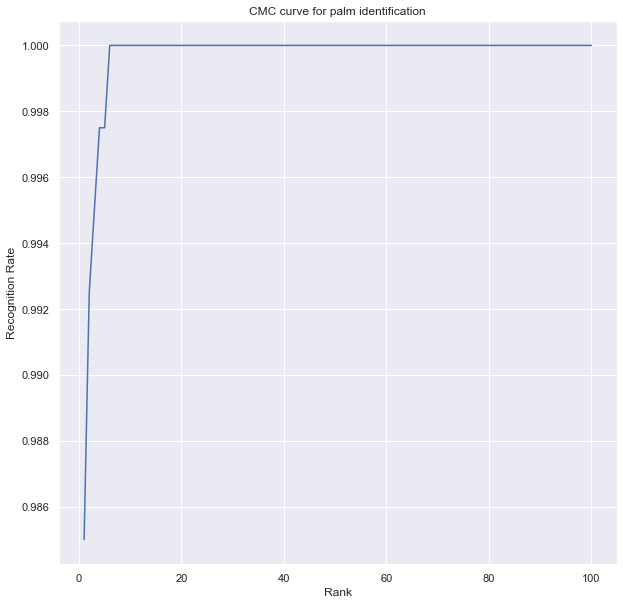

In [214]:
fig, axis = plt.subplots(1,1,figsize=(10,10))
axis.plot(np.arange(1, 101), recognition_rate)
axis.title.set_text("CMC curve for palm identification") 
axis.set_xlabel('Rank')
axis.set_ylabel('Recognition Rate')


In [215]:
from beautifultable import BeautifulTable


rank_1_recognition_rate = recognition_rate[1]


table = BeautifulTable()
table.rows.append([rank_1_recognition_rate])
table.rows.header = ["Palmprint"]
table.columns.header = ["Rank 1 recognition rate"]
print(table)

+-----------+-------------------------+
|           | Rank 1 recognition rate |
+-----------+-------------------------+
| Palmprint |          0.985          |
+-----------+-------------------------+
